In [1]:
nwk_file = r"..\input\aligned_caffeine_without_nodes_w_no_coords_tree.nwk"
gps_coords = r"..\input\coords_w_caff_wout_no_caff_nodes.csv"
offsets_file = r"..\input\offsets_caff.csv"

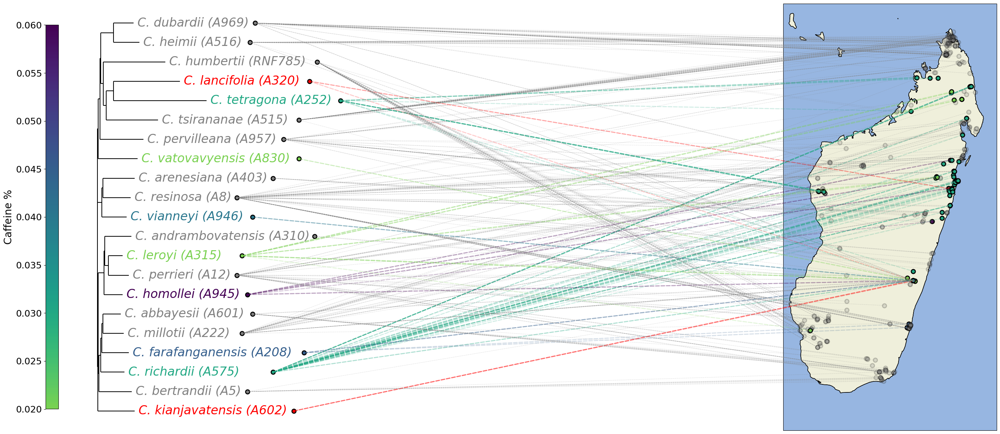

In [10]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
import matplotlib.cm as cm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import numpy as np
from Bio import Phylo
import argparse

label_map = {
    "C_abbayesii_A601": "C. abbayesii (A601)",
    "C_ambodirianensis_A572": "C. ambodirianensis (A572)",
    "C_ambongensis": "C. ambongensis",
    "C_andrambovatensis_A310": "C. andrambovatensis (A310)",
    "C_ankaranensis_A525": "C. ankaranensis (A525)",
    "C_arenesiana_A403": "C. arenesiana (A403)",
    "C_augagneuri_A966": "C. augagneuri (A966)",
    "C_bernardiniana_MDC": "C. bernardiniana (MDC)",
    "C_bertrandii_A5": "C. bertrandii (A5)",
    "C_bissetiae": "C. bissetiae",
    "C_boinensis": "C. boinensis",
    "C_boiviniana_A980": "C. boiviniana (A980)",
    "C_bonnieri_A535": "C. bonnieri (A535)",
    "C_costei_A956": "C. costei (A956)",
    "C_dolichophylla_A206": "C. dolichophylla (A206)",
    "C_dubardii_A969": "C. dubardii (A969)",
    "C_farafanganensis_A208": "C. farafanganensis (A208)",
    "C_heimii_A516": "C. heimii (A516)",
    "C_homollei_A945": "C. homollei (A945)",
    "C_humbertii_RNF785": "C. humbertii (RNF785)",
    "C_humblotiana_BM19_20": "C. humblotiana (BM19, 20)",
    "C_jumellei_A974": "C. jumellei (A974)",
    "C_kianjavatensis_A602": "C. kianjavatensis (A602)",
    "C_kihansiensis_APD2922": "C. kihansiensis (APD2922)",
    "C_labatii_APD3096": "C. labatii (APD3096)",
    "C_lancifolia_A320": "C. lancifolia (A320)",
    "C_leroyi_A315": "C. leroyi (A315)",
    "C_liaudii_A1013": "C. liaudii (A1013)",
    "C_macrocarpa-PET": "C. macrocarpa (PET)",
    "C_mauritiana_BM17_25": "C. mauritiana (BM17, 25)",
    "C_mauritiana_Makes4": "C. mauritiana (Makes4)",
    "C_mcphersonii_A977": "C. mcphersonii (A977)",
    "C_millotii_A222": "C. millotii (A222)",
    "C_mogeneti_A975": "C. mogeneti (A975)",
    "C_montis-sacri_A321": "C. montis-sacri (A321)",
    "C_myrtifolia_MBR_A9": "C. myrtifolia (MBR, A9)",
    "C_perrieri_A12": "C. perrieri (A12)",
    "C_pervilleana_A957": "C. pervilleana (A957)",
    "C_ratsimamangae_A528": "C. ratsimamangae (A528)",
    "C_resinosa_A8": "C. resinosa (A8)",
    "C_richardii_A575": "C. richardii (A575)",
    "C_sahafaryensis_A978": "C. sahafaryensis (A978)",
    "C_sakarahae_A304": "C. sakarahae (A304)",
    "C_tetragona_A252": "C. tetragona (A252)",
    "C_tsirananae_A515": "C. tsirananae (A515)",
    "C_vatovavyensis_A830": "C. vatovavyensis (A830)",
    "C_vianneyi_A946": "C. vianneyi (A946)",
    "Tricalysia": "C. Tricalysia",
}


def custom_label(clade):
    if clade.is_terminal():
        # return clade.name
        return label_map.get(clade.name, clade.name)
    else:
        return None


def calc_node_positions(tree, x_start, x_end, y_start, y_step):
    if tree.is_terminal():
        x_pos = x_start
        y_pos = y_start
        y_start += y_step
    else:
        x_pos = (x_start + x_end) / 2
        y_pos = y_start

        child_y_start = y_start
        for child in tree.clades:
            child_x_pos, child_y_pos, y_start = calc_node_positions(
                child, x_start, x_end, y_start, y_step
            )
            x_start = child_x_pos

        y_pos = (y_start + child_y_start) / 2

    tree.position = (x_pos, y_pos)
    return x_pos, y_pos, y_start


def get_x_offset(node_name, offsets_dict):
    return offsets_dict.get(node_name, 0)  # default offset is 0 if not found


def plot_adjusted_node(ax, node, y_offset, offsets_dict, gps):
    x, y = node.position
    x_offset = get_x_offset(node.name, offsets_dict)
    x += x_offset
    y += y_offset

    # Default color if node name is not found
    color = "grey"

    # Check if node name is in the gps DataFrame and set color accordingly
    if node.name in gps["specimen_id"].values:
        color = gps[gps["specimen_id"] == node.name]["color"].values[0]

    ax.plot(
        x,
        y,
        "o",
        markersize=8,
        markerfacecolor=color,
        markeredgewidth=2,
        markeredgecolor="black",
    )
    return x, y


def value_to_color_old(val):
    if val == 0.00:
        return "grey"
    elif 0.00 < val < 0.7:
        base_cmap = plt.get_cmap("viridis")
        newcolors = base_cmap(np.linspace(0, 0.8, 256))
        viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
        cmap = viridis_no_yellow
        norm = mcolors.Normalize(vmin=0.02, vmax=0.06)
        return mcolors.to_hex(cmap(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def value_to_color_v03(val):
    color_map = {
        1: "red",
        2: "blue",
        0.00: "green",
        4: "purple",
        5: "orange",
        6: "cyan",
        0.7: "magenta",
        0.8: "grey",
        0.9: "brown",
    }
    return color_map.get(
        val, "black"
    )  # Default to 'grey' if the value is not in the dictionary


base = plt.get_cmap("viridis")
newcols = base(np.linspace(0, 0.8, 256))
cmap_noy = mcolors.ListedColormap(newcols, name="viridis_no_yellow")
cmap_rev = cmap_noy.reversed()
norm = mcolors.Normalize(vmin=0.02, vmax=0.06)


def value_to_color(val):
    if val == 0.0:
        return "grey"
    elif 0.0 < val < 0.7:
        return mcolors.to_hex(cmap_rev(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def main():
    # parser = argparse.ArgumentParser(description="PhyloCartoPlot Main script")
    # parser.add_argument(
    #     "--nwk", type=str, required=True, help="Path to the file for tree in nwk format"
    # )
    # parser.add_argument(
    #     "--gps", type=str, required=True, help="Path to the file for gps coordinates"
    # )
    # parser.add_argument(
    #     "--offset", type=str, required=True, help="Path to the file for ajustments"
    # )

    # args = parser.parse_args()

    # Create a new map with PlateCarree projection
    fig = plt.figure(figsize=(35, 12))

    # --------------------------------------
    # ------------  Phylogenetic MAP -------
    # --------------------------------------

    # Load the tree
    # tree = Phylo.read(args.nwk, "newick")
    tree = Phylo.read(nwk_file, "newick")

    # Load offsets from CSV
    # offsets_df = pd.read_csv(args.offset)
    offsets_df = pd.read_csv(offsets_file)

    offsets_dict = pd.Series(
        offsets_df.XOffset.values, index=offsets_df.NodeName
    ).to_dict()

    # Calculate positions for all nodes
    y_step = 1
    calc_node_positions(tree.root, 0, 1, 0, y_step)

    # Create a figure for the subplot
    ax_tree = fig.add_subplot(121)

    # gps = pd.read_csv(args.gps)
    gps = pd.read_csv(gps_coords)

    gps["color"] = gps["caffeine_percent"].apply(value_to_color)
    # text_colors = dict(zip(gps["specimen_id"], gps["color"]))
    # raw_color_map = dict(zip(gps["specimen_id"], gps["color"]))

    # # build a map from *displayed* label → color
    # text_colors = {label_map.get(raw, raw): col for raw, col in raw_color_map.items()}

    valmap = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    # 2) ta cmap “no yellow” et sa version inversée
    base = plt.get_cmap("viridis")
    newcolors = base(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap_rev = viridis_no_yellow.reversed()

    # 3) la normalisation
    norm = mcolors.Normalize(vmin=0.02, vmax=0.06)

    # 4) construction de text_colors en gardant grey pour 0.0
    text_colors = {
        label_map.get(raw, raw): (
            "grey"
            if valmap[raw] == 0.0
            else (
                mcolors.to_hex(cmap_rev(norm(valmap[raw])))  # 0<val<0.7 → reversed cmap
                if 0.0 < valmap[raw] < 0.7
                else "red" if valmap[raw] == 0.7 else "black"
            )
        )
        for raw in gps["specimen_id"]
    }

    # Plot the tree
    Phylo.draw(
        tree,
        do_show=False,
        axes=ax_tree,
        label_func=custom_label,
        label_colors=text_colors,
    )

    for txt in ax_tree.texts:
        txt.set_fontsize(24)
        txt.set_fontstyle("italic")

    # ax_tree.set_title("Coffea species with their geolocation per caffeine content", fontsize=18)
    ax_tree.set_frame_on(False)  # Remove the border/frame
    ax_tree.axis("off")  # Turn off the axes, including ticks and labels
    # Set axes limits to verify the data range
    ax_tree.set_xlim(-0.05, 1)
    ax_tree.set_ylim(0, max(node.position[1] for node in tree.get_terminals()) + 2)

    node_positions = {clade.name: clade.position for clade in tree.find_clades()}

    # Generate DataFrame with node coordinates (commented out as unnecessary here)
    rows = []
    for clade in tree.find_clades():
        if clade.is_terminal():
            label = clade.name
            x, y = plot_adjusted_node(
                ax_tree, clade, y_step, offsets_dict, gps
            )  # Adjust offsets if necessary
            rows.append([label, (x, y)])

    # Create DataFrame with node coordinates (commented out as unnecessary here)
    df = pd.DataFrame(rows, columns=["ID", "Coordinates"])

    # --------------------------------------
    # ------------  GRAPH MAP --------------
    # --------------------------------------

    # Create subplot 2 with the map plot
    ax2 = fig.add_subplot(122, projection=ccrs.PlateCarree())
    extent = [43, 51, -27, -11]
    ax2.set_extent(extent)

    # Plot points from GPS dataframe on the map
    for _, row in gps.iterrows():
        is_zero = row["caffeine_percent"] == 0.0
        ax2.plot(
            row["longitude"],
            row["latitude"],
            "o",
            markersize=8,
            markerfacecolor=row["color"],
            markeredgewidth=2,
            markeredgecolor="black",
            alpha=0.2 if is_zero else 1.0,  # ← 50% transparent grey dots
        )


    ax2.coastlines(resolution="10m")
    ax2.add_feature(cfeature.LAND)
    ax2.add_feature(cfeature.OCEAN)
    ax2.add_feature(cfeature.COASTLINE)
    ax2.add_feature(cfeature.BORDERS)

    # ax2.set_xlabel("Longitude")
    # ax2.set_ylabel("Latitude")
    # ax2.spines["geo"].set_visible(False)

    legend_handles = [
        mlines.Line2D(
            [], [], color="grey", marker="o", linestyle="None", label="0% caffeine"
        ),
        mlines.Line2D(
            [],
            [],
            color="purple",
            marker="o",
            linestyle="None",
            label="0.02–0.06% caffeine",
        ),
        mlines.Line2D(
            [], [], color="red", marker="o", linestyle="None", label="0.7% caffeine"
        ),
    ]
    # ax2.legend(
    #     handles=legend_handles,
    #     loc="lower right",
    #     frameon=True,
    #     fontsize=12,
    # )

    # build a ScalarMappable for your viridis gradient
    base_cmap = plt.get_cmap("viridis")
    newcolors = base_cmap(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap = viridis_no_yellow.reversed()

    norm = mpl.colors.Normalize(vmin=0.02, vmax=0.06)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

    cbar = fig.colorbar(
        sm,
        ax=ax_tree,
        orientation="vertical",  # or 'horizontal'
        pad=0.02,  # spacing between plot and bar
        location="left",  # ← put bar on the left
        shrink=0.9,  # shorten it to 70% of the axes height
        aspect=30,  # make it thinner (higher → thinner)
    )
    cbar.set_label("Caffeine %", fontsize=20)
    cbar.ax.tick_params(labelsize=18)

    # --------------------------------------
    # ------------  Line mapping -----------
    # --------------------------------------

    # Group gps DataFrame by ID and create a dictionary of lists of coordinates
    gps_grouped = (
        gps.groupby("specimen_id")[["longitude", "latitude", "color"]]
        .apply(lambda x: list(zip(x["longitude"], x["latitude"], x["color"])))
        .to_dict()
    )
    caff_dict = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    for index, row in df.iterrows():
        specimen = row["ID"]
        if specimen in gps_grouped:
            for longitude, latitude, color in gps_grouped[specimen]:
                caf = caff_dict.get(specimen, 0.0)
                lw = 2.0 if caf > 0 else 0.8
                # if the line is grey (0% caffeine) make it 50% opaque, else keep your 0.2
                line_alpha = 0.2 if color == "grey" else 0.2

                con = ConnectionPatch(
                    xyA=row["Coordinates"],
                    coordsA="data",
                    xyB=(longitude, latitude),
                    coordsB="data",
                    axesA=ax_tree,
                    axesB=ax2,
                    color=color,
                    linewidth=lw,  # whatever logic you already have for line thickness
                    linestyle="--",
                    alpha=line_alpha,  # ← use our conditional transparency
                    zorder=2,
                )
                fig.add_artist(con)

    fig.subplots_adjust(wspace=1.5)
    plt.tight_layout()
    output_file = r"..\images\tree2_blank_map.svg"
    plt.savefig(output_file, format="svg", transparent=True, bbox_inches="tight", pad_inches=0.1)
    output_file = r"..\images\tree2_blank_map.png"
    plt.savefig(output_file, format="png", transparent=True)
    plt.show()
    plt.close(fig)


if __name__ == "__main__":
    main()

    # nwk_file = r"..\input\aligned_caffeine_tree.nwk"
    # gps_coords = r'..\tmp\file_w_caffeine.csv'
    # offsets_file = r"..\input\offsets_caff.csv"
# example use
# python .\tree_to_map_caffeine_content.py --nwk nwk_file --gps gps_coords --offset offsets_file


Raster file: madaclim_enviro.tif
Total bands: 9
CRS: EPSG:32738
Shape: 1528 x 803
--------------------------------------------------------------------------------
Band 1: alt      | Altitude (meters)
Band 2: slo      | Slope (degrees)
Band 3: asp      | Aspect; clockwise from North (degrees)
Band 4: solrad   | Solar radiation; computed from altitude, slope and aspect (Wh.m-2.day-1)
Band 5: forcov   | Percentage of forest cover in 1 km by 1 km grid cells (%)
Band 6: soi      | Soil types
Band 7: veg      | Vegetation types
Band 8: wat      | Watersheds
Band 9: forcov   | Forest cover (%)
--------------------------------------------------------------------------------

RASTER BANDS METADATA
Band 1: alt      | Altitude (meters)
Band 2: slo      | Slope (degrees)
Band 3: asp      | Aspect; clockwise from North (degrees)
Band 4: solrad   | Solar radiation; computed from altitude, slope and aspect (Wh.m-2.day-1)
Band 5: forcov   | Percentage of forest cover in 1 km by 1 km grid cells (%)
Ba

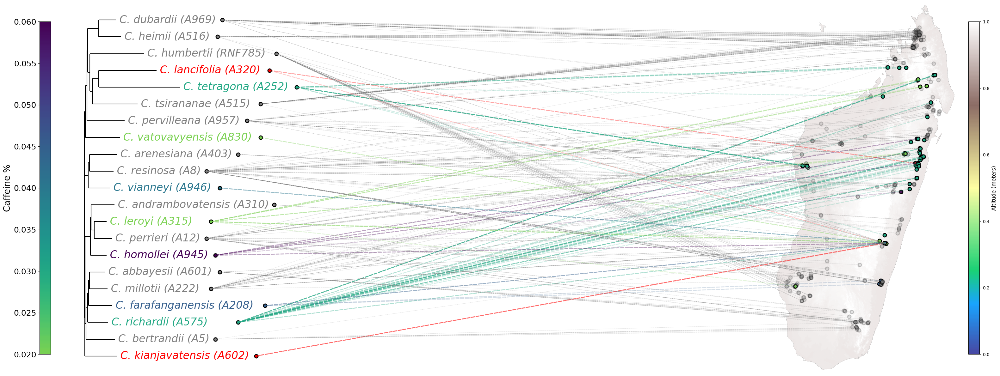

In [36]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
import matplotlib.cm as cm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import numpy as np
from Bio import Phylo
import argparse
import rasterio
from rasterio.plot import show
from pathlib import Path
import json

class RasterMetadata:
    """
    A class to extract and manage metadata from raster files.
    Similar to py_madaclim's MadaclimLayers, this class reads band information
    from GeoTIFF files and provides methods to query and retrieve band metadata.
    """
    
    def __init__(self, raster_path, metadata_file=None):
        """
        Initialize RasterMetadata by reading the raster file and extracting band information.
        
        Args:
            raster_path (str or Path): Path to the raster file
            metadata_file (str or Path, optional): Path to JSON metadata file with band descriptions
        """
        self.raster_path = Path(raster_path)
        self.metadata_file = Path(metadata_file) if metadata_file else None
        self.metadata = self._load_metadata() if self.metadata_file else {}
        self._validate_raster()
        self.bands_info = self._extract_bands_metadata()
    
    def _validate_raster(self):
        """Validate that the raster file exists and is readable."""
        if not self.raster_path.exists():
            raise FileNotFoundError(f"Raster file not found: {self.raster_path}")
        
        try:
            with rasterio.open(self.raster_path) as src:
                pass
        except Exception as e:
            raise IOError(f"Cannot open raster file: {e}")
    
    def _load_metadata(self) -> dict:
        """
        Load band metadata from a JSON file.
        
        Returns:
            dict: Metadata dictionary loaded from JSON file
        """
        if not self.metadata_file or not self.metadata_file.exists():
            return {}
        
        try:
            with open(self.metadata_file, 'r') as f:
                return json.load(f)
        except Exception as e:
            print(f"Warning: Could not load metadata file: {e}")
            return {}
    
    def _extract_bands_metadata(self) -> pd.DataFrame:
        """
        Extract metadata for all bands in the raster file.
        Uses loaded metadata JSON file if available.
        
        Returns:
            pd.DataFrame: DataFrame containing band information with columns:
                - band_number: Band index (1-indexed)
                - band_name: Band description/name
                - band_description: Detailed description (if available)
        """
        # Define band mapping for madaclim environmental raster
        band_mapping = {
            1: {"name": "alt", "description": "Altitude (meters)"},
            2: {"name": "slo", "description": "Slope (degrees)"},
            3: {"name": "asp", "description": "Aspect; clockwise from North (degrees)"},
            4: {"name": "solrad", "description": "Solar radiation (Wh.m-2.day-1)"},
            5: {"name": "geo", "description": "Rock types (Geology)"},
            6: {"name": "soi", "description": "Soil types"},
            7: {"name": "veg", "description": "Vegetation types"},
            8: {"name": "wat", "description": "Watersheds"},
            9: {"name": "forcov", "description": "Forest cover (%)"},
        }
        
        # If metadata was loaded, use table_4 for non-categorical bands
        if self.metadata and "table_4" in self.metadata:
            table_4 = self.metadata["table_4"]
            layer_names = table_4.get("layer_name", [])
            layer_descs = table_4.get("layer_description", [])
            
            for i, (name, desc) in enumerate(zip(layer_names, layer_descs)):
                if (i + 1) in band_mapping:
                    band_mapping[i + 1] = {"name": name, "description": desc}
        
        bands_list = []
        
        with rasterio.open(self.raster_path) as src:
            print(f"\nRaster file: {self.raster_path.name}")
            print(f"Total bands: {src.count}")
            print(f"CRS: {src.crs}")
            print(f"Shape: {src.height} x {src.width}")
            print("-" * 80)
            
            for band_idx in range(1, src.count + 1):
                # Use mapping or fallback to generic name
                if band_idx in band_mapping:
                    band_name = band_mapping[band_idx]["name"]
                    band_description = band_mapping[band_idx]["description"]
                else:
                    band_name = f"Band {band_idx}"
                    band_description = f"Band {band_idx}"
                
                bands_list.append({
                    'band_number': band_idx,
                    'band_name': band_name,
                    'band_description': band_description,
                })
                
                print(f"Band {band_idx}: {band_name:8} | {band_description}")
        
        print("-" * 80)
        df = pd.DataFrame(bands_list)
        return df
    
    def get_band_name(self, band_number: int) -> str:
        """
        Get the short name of a specific band (e.g., 'alt', 'slo').
        
        Args:
            band_number (int): Band number (1-indexed)
            
        Returns:
            str: Band short name
        """
        if band_number < 1 or band_number > len(self.bands_info):
            raise ValueError(f"Band {band_number} is out of range (1-{len(self.bands_info)})")
        
        return self.bands_info.iloc[band_number - 1]['band_name']
    
    def get_band_description(self, band_number: int) -> str:
        """
        Get the full description of a specific band (e.g., 'Altitude (meters)').
        
        Args:
            band_number (int): Band number (1-indexed)
            
        Returns:
            str: Band full description
        """
        if band_number < 1 or band_number > len(self.bands_info):
            raise ValueError(f"Band {band_number} is out of range (1-{len(self.bands_info)})")
        
        return self.bands_info.iloc[band_number - 1]['band_description']
    
    def get_all_bands_info(self) -> pd.DataFrame:
        """
        Get complete metadata for all bands.
        
        Returns:
            pd.DataFrame: DataFrame with band information
        """
        return self.bands_info.copy()
    
    def display_bands(self):
        """Print a formatted table of all bands and their information."""
        print("\n" + "=" * 80)
        print("RASTER BANDS METADATA")
        print("=" * 80)
        for _, row in self.bands_info.iterrows():
            print(f"Band {row['band_number']}: {row['band_name']:8} | {row['band_description']}")
        print("=" * 80 + "\n")

label_map = {
    "C_abbayesii_A601": "C. abbayesii (A601)",
    "C_ambodirianensis_A572": "C. ambodirianensis (A572)",
    "C_ambongensis": "C. ambongensis",
    "C_andrambovatensis_A310": "C. andrambovatensis (A310)",
    "C_ankaranensis_A525": "C. ankaranensis (A525)",
    "C_arenesiana_A403": "C. arenesiana (A403)",
    "C_augagneuri_A966": "C. augagneuri (A966)",
    "C_bernardiniana_MDC": "C. bernardiniana (MDC)",
    "C_bertrandii_A5": "C. bertrandii (A5)",
    "C_bissetiae": "C. bissetiae",
    "C_boinensis": "C. boinensis",
    "C_boiviniana_A980": "C. boiviniana (A980)",
    "C_bonnieri_A535": "C. bonnieri (A535)",
    "C_costei_A956": "C. costei (A956)",
    "C_dolichophylla_A206": "C. dolichophylla (A206)",
    "C_dubardii_A969": "C. dubardii (A969)",
    "C_farafanganensis_A208": "C. farafanganensis (A208)",
    "C_heimii_A516": "C. heimii (A516)",
    "C_homollei_A945": "C. homollei (A945)",
    "C_humbertii_RNF785": "C. humbertii (RNF785)",
    "C_humblotiana_BM19_20": "C. humblotiana (BM19, 20)",
    "C_jumellei_A974": "C. jumellei (A974)",
    "C_kianjavatensis_A602": "C. kianjavatensis (A602)",
    "C_kihansiensis_APD2922": "C. kihansiensis (APD2922)",
    "C_labatii_APD3096": "C. labatii (APD3096)",
    "C_lancifolia_A320": "C. lancifolia (A320)",
    "C_leroyi_A315": "C. leroyi (A315)",
    "C_liaudii_A1013": "C. liaudii (A1013)",
    "C_macrocarpa-PET": "C. macrocarpa (PET)",
    "C_mauritiana_BM17_25": "C. mauritiana (BM17, 25)",
    "C_mauritiana_Makes4": "C. mauritiana (Makes4)",
    "C_mcphersonii_A977": "C. mcphersonii (A977)",
    "C_millotii_A222": "C. millotii (A222)",
    "C_mogeneti_A975": "C. mogeneti (A975)",
    "C_montis-sacri_A321": "C. montis-sacri (A321)",
    "C_myrtifolia_MBR_A9": "C. myrtifolia (MBR, A9)",
    "C_perrieri_A12": "C. perrieri (A12)",
    "C_pervilleana_A957": "C. pervilleana (A957)",
    "C_ratsimamangae_A528": "C. ratsimamangae (A528)",
    "C_resinosa_A8": "C. resinosa (A8)",
    "C_richardii_A575": "C. richardii (A575)",
    "C_sahafaryensis_A978": "C. sahafaryensis (A978)",
    "C_sakarahae_A304": "C. sakarahae (A304)",
    "C_tetragona_A252": "C. tetragona (A252)",
    "C_tsirananae_A515": "C. tsirananae (A515)",
    "C_vatovavyensis_A830": "C. vatovavyensis (A830)",
    "C_vianneyi_A946": "C. vianneyi (A946)",
    "Tricalysia": "C. Tricalysia",
}


def custom_label(clade):
    if clade.is_terminal():
        # return clade.name
        return label_map.get(clade.name, clade.name)
    else:
        return None


def calc_node_positions(tree, x_start, x_end, y_start, y_step):
    if tree.is_terminal():
        x_pos = x_start
        y_pos = y_start
        y_start += y_step
    else:
        x_pos = (x_start + x_end) / 2
        y_pos = y_start

        child_y_start = y_start
        for child in tree.clades:
            child_x_pos, child_y_pos, y_start = calc_node_positions(
                child, x_start, x_end, y_start, y_step
            )
            x_start = child_x_pos

        y_pos = (y_start + child_y_start) / 2

    tree.position = (x_pos, y_pos)
    return x_pos, y_pos, y_start


def get_x_offset(node_name, offsets_dict):
    return offsets_dict.get(node_name, 0)  # default offset is 0 if not found


def plot_adjusted_node(ax, node, y_offset, offsets_dict, gps):
    x, y = node.position
    x_offset = get_x_offset(node.name, offsets_dict)
    x += x_offset
    y += y_offset

    # Default color if node name is not found
    color = "grey"

    # Check if node name is in the gps DataFrame and set color accordingly
    if node.name in gps["specimen_id"].values:
        color = gps[gps["specimen_id"] == node.name]["color"].values[0]

    ax.plot(
        x,
        y,
        "o",
        markersize=8,
        markerfacecolor=color,
        markeredgewidth=2,
        markeredgecolor="black",
    )
    return x, y


def value_to_color_old(val):
    if val == 0.00:
        return "grey"
    elif 0.00 < val < 0.7:
        base_cmap = plt.get_cmap("viridis")
        newcolors = base_cmap(np.linspace(0, 0.8, 256))
        viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
        cmap = viridis_no_yellow
        norm = mcolors.Normalize(vmin=0.02, vmax=0.06)
        return mcolors.to_hex(cmap(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def value_to_color_v03(val):
    color_map = {
        1: "red",
        2: "blue",
        0.00: "green",
        4: "purple",
        5: "orange",
        6: "cyan",
        0.7: "magenta",
        0.8: "grey",
        0.9: "brown",
    }
    return color_map.get(
        val, "black"
    )  # Default to 'grey' if the value is not in the dictionary


base = plt.get_cmap("viridis")
newcols = base(np.linspace(0, 0.8, 256))
cmap_noy = mcolors.ListedColormap(newcols, name="viridis_no_yellow")
cmap_rev = cmap_noy.reversed()
norm = mcolors.Normalize(vmin=0.02, vmax=0.06)


def value_to_color(val):
    if val == 0.0:
        return "grey"
    elif 0.0 < val < 0.7:
        return mcolors.to_hex(cmap_rev(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def main():
    # Path to your raster file - UPDATE THIS PATH
    raster_file = r"..\input\madaclim_enviro.tif"  # Path to your environmental raster
    metadata_file = r"..\input\env_metadata.json"  # Path to metadata JSON file
    raster_band = 1  # Which band to display (1-indexed): 1=alt, 2=slo, 3=asp, 4=solrad, 5=geo, 6=soi, 7=veg, 8=wat, 9=forcov
    raster_cmap = "terrain"  # Colormap for raster: "terrain", "viridis", "gray", etc.

    # parser = argparse.ArgumentParser(description="PhyloCartoPlot Main script")
    # parser.add_argument(
    #     "--nwk", type=str, required=True, help="Path to the file for tree in nwk format"
    # )
    # parser.add_argument(
    #     "--gps", type=str, required=True, help="Path to the file for gps coordinates"
    # )
    # parser.add_argument(
    #     "--offset", type=str, required=True, help="Path to the file for ajustments"
    # )

    # args = parser.parse_args()

    # Create a new map with PlateCarree projection
    fig = plt.figure(figsize=(35, 12))

    # --------------------------------------
    # ------------  Phylogenetic MAP -------
    # --------------------------------------

    # Load the tree
    # tree = Phylo.read(args.nwk, "newick")
    tree = Phylo.read(nwk_file, "newick")

    # Load offsets from CSV
    # offsets_df = pd.read_csv(args.offset)
    offsets_df = pd.read_csv(offsets_file)

    offsets_dict = pd.Series(
        offsets_df.XOffset.values, index=offsets_df.NodeName
    ).to_dict()

    # Calculate positions for all nodes
    y_step = 1
    calc_node_positions(tree.root, 0, 1, 0, y_step)

    # Create a figure for the subplot
    ax_tree = fig.add_subplot(121)

    # gps = pd.read_csv(args.gps)
    gps = pd.read_csv(gps_coords)

    gps["color"] = gps["caffeine_percent"].apply(value_to_color)
    # text_colors = dict(zip(gps["specimen_id"], gps["color"]))
    # raw_color_map = dict(zip(gps["specimen_id"], gps["color"]))

    # # build a map from *displayed* label → color
    # text_colors = {label_map.get(raw, raw): col for raw, col in raw_color_map.items()}

    valmap = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    # 2) ta cmap "no yellow" et sa version inversée
    base = plt.get_cmap("viridis")
    newcolors = base(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap_rev = viridis_no_yellow.reversed()

    # 3) la normalisation
    norm = mcolors.Normalize(vmin=0.02, vmax=0.06)

    # 4) construction de text_colors en gardant grey pour 0.0
    text_colors = {
        label_map.get(raw, raw): (
            "grey"
            if valmap[raw] == 0.0
            else (
                mcolors.to_hex(cmap_rev(norm(valmap[raw])))  # 0<val<0.7 → reversed cmap
                if 0.0 < valmap[raw] < 0.7
                else "red" if valmap[raw] == 0.7 else "black"
            )
        )
        for raw in gps["specimen_id"]
    }

    # Plot the tree
    Phylo.draw(
        tree,
        do_show=False,
        axes=ax_tree,
        label_func=custom_label,
        label_colors=text_colors,
    )

    for txt in ax_tree.texts:
        txt.set_fontsize(24)
        txt.set_fontstyle("italic")

    # ax_tree.set_title("Coffea species with their geolocation per caffeine content", fontsize=18)
    ax_tree.set_frame_on(False)  # Remove the border/frame
    ax_tree.axis("off")  # Turn off the axes, including ticks and labels
    # Set axes limits to verify the data range
    ax_tree.set_xlim(-0.05, 1)
    ax_tree.set_ylim(0, max(node.position[1] for node in tree.get_terminals()) + 2)

    node_positions = {clade.name: clade.position for clade in tree.find_clades()}

    # Generate DataFrame with node coordinates (commented out as unnecessary here)
    rows = []
    for clade in tree.find_clades():
        if clade.is_terminal():
            label = clade.name
            x, y = plot_adjusted_node(
                ax_tree, clade, y_step, offsets_dict, gps
            )  # Adjust offsets if necessary
            rows.append([label, (x, y)])

    # Create DataFrame with node coordinates (commented out as unnecessary here)
    df = pd.DataFrame(rows, columns=["ID", "Coordinates"])

    # --------------------------------------
    # ------------ RASTER MAP (instead of coastlines) -------
    # --------------------------------------

    # Create subplot 2 with the map plot
    ax2 = fig.add_subplot(122, projection=ccrs.PlateCarree())
    extent = [43, 51, -27, -11]
    ax2.set_extent(extent)
    
    # Remove border/frame from ax2
    ax2.set_frame_on(False)
    ax2.axis("off")

    # ======== RASTERIO: Load and display raster band ========
    try:
        # Initialize RasterMetadata to extract band information
        raster_metadata = RasterMetadata(raster_file, metadata_file=metadata_file)
        
        # Display all available bands
        raster_metadata.display_bands()
        
        # Get the band name for the selected band
        band_description = raster_metadata.get_band_description(raster_band)
        print(f"Selected band: {raster_band}")
        print(f"Band label: {band_description}\n")
        
        # Read the specified band
        with rasterio.open(raster_file) as src:
            raster_data = src.read(raster_band)
        
        print(f"Raster data shape: {raster_data.shape}")
        print(f"Raster data type: {raster_data.dtype}")
        
        # ===== CONTRAST ENHANCEMENT =====
        # Stretch contrast using percentiles (2% to 98%)
        vmin = np.percentile(raster_data, 2)
        vmax = np.percentile(raster_data, 98)
        
        print(f"Contrast: vmin={vmin}, vmax={vmax}")
        
        # Normalize raster data for better contrast
        raster_normalized = np.clip((raster_data - vmin) / (vmax - vmin), 0, 1)
        
        # ===== MASK WATER (set to NaN where water is) =====
        # Create a masked array - set invalid/water pixels to NaN
        # Adjust the threshold based on your raster (water typically has low/negative values)
        raster_masked = raster_normalized.copy().astype(float)
        raster_masked[raster_data < 0] = np.nan  # Mask negative values (water in DEM)
        
        print(f"Raster masked shape: {raster_masked.shape}")
        
        # Plot the raster on the cartopy map
        im = ax2.imshow(
            raster_masked,
            transform=ccrs.PlateCarree(),
            cmap=raster_cmap,
            extent=extent,
            origin="upper",
            alpha=0.9,  # Semi-transparent so data points show through
            vmin=0,
            vmax=1,
        )
        
        # Add land borders on top to define the region clearly
        ax2.add_feature(cfeature.BORDERS, linewidth=0.5, edgecolor='black')
        
        # Add colorbar for the raster on the right side
        cbar_raster = fig.colorbar(
            im,
            ax=ax2,
            orientation="vertical",
            pad=0.02,
            location="right",
            shrink=0.9,
            aspect=30,
            label=band_description,
        )
        cbar_raster.set_label(band_description, fontsize=12)
        cbar_raster.ax.tick_params(labelsize=10)
        
        print("Raster displayed successfully!")
            
    except Exception as e:
        print(f"\nError loading raster file: {type(e).__name__}: {e}")
        import traceback
        print("\nFull traceback:")
        traceback.print_exc()
        print(f"\nFalling back to default map features...")
        # Fallback to coastlines if raster fails
        ax2.coastlines(resolution="10m")
        ax2.add_feature(cfeature.LAND)
        ax2.add_feature(cfeature.OCEAN)
        ax2.add_feature(cfeature.COASTLINE)
        ax2.add_feature(cfeature.BORDERS)

    # Plot points from GPS dataframe on top of raster
    for _, row in gps.iterrows():
        is_zero = row["caffeine_percent"] == 0.0
        ax2.plot(
            row["longitude"],
            row["latitude"],
            "o",
            markersize=8,
            markerfacecolor=row["color"],
            markeredgewidth=2,
            markeredgecolor="black",
            alpha=0.2 if is_zero else 1.0,  # ← 50% transparent grey dots
        )

    # ax2.set_xlabel("Longitude")
    # ax2.set_ylabel("Latitude")
    # ax2.spines["geo"].set_visible(False)

    legend_handles = [
        mlines.Line2D(
            [], [], color="grey", marker="o", linestyle="None", label="0% caffeine"
        ),
        mlines.Line2D(
            [],
            [],
            color="purple",
            marker="o",
            linestyle="None",
            label="0.02–0.06% caffeine",
        ),
        mlines.Line2D(
            [], [], color="red", marker="o", linestyle="None", label="0.7% caffeine"
        ),
    ]
    # ax2.legend(
    #     handles=legend_handles,
    #     loc="lower right",
    #     frameon=True,
    #     fontsize=12,
    # )

    # build a ScalarMappable for your viridis gradient
    base_cmap = plt.get_cmap("viridis")
    newcolors = base_cmap(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap = viridis_no_yellow.reversed()

    norm = mpl.colors.Normalize(vmin=0.02, vmax=0.06)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

    cbar = fig.colorbar(
        sm,
        ax=ax_tree,
        orientation="vertical",  # or 'horizontal'
        pad=0.02,  # spacing between plot and bar
        location="left",  # ← put bar on the left
        shrink=0.9,  # shorten it to 70% of the axes height
        aspect=30,  # make it thinner (higher → thinner)
    )
    cbar.set_label("Caffeine %", fontsize=20)
    cbar.ax.tick_params(labelsize=18)

    # --------------------------------------
    # ------------  Line mapping -----------
    # --------------------------------------

    # Group gps DataFrame by ID and create a dictionary of lists of coordinates
    gps_grouped = (
        gps.groupby("specimen_id")[["longitude", "latitude", "color"]]
        .apply(lambda x: list(zip(x["longitude"], x["latitude"], x["color"])))
        .to_dict()
    )
    caff_dict = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    for index, row in df.iterrows():
        specimen = row["ID"]
        if specimen in gps_grouped:
            for longitude, latitude, color in gps_grouped[specimen]:
                caf = caff_dict.get(specimen, 0.0)
                lw = 2.0 if caf > 0 else 0.8
                # if the line is grey (0% caffeine) make it 50% opaque, else keep your 0.2
                line_alpha = 0.2 if color == "grey" else 0.2

                con = ConnectionPatch(
                    xyA=row["Coordinates"],
                    coordsA="data",
                    xyB=(longitude, latitude),
                    coordsB="data",
                    axesA=ax_tree,
                    axesB=ax2,
                    color=color,
                    linewidth=lw,  # whatever logic you already have for line thickness
                    linestyle="--",
                    alpha=line_alpha,  # ← use our conditional transparency
                    zorder=2,
                )
                fig.add_artist(con)

    fig.subplots_adjust(wspace=1.5)
    plt.tight_layout()
    output_file = r"..\images\tree2_raster_map.svg"
    plt.savefig(output_file, format="svg", transparent=True, bbox_inches="tight", pad_inches=0.1)
    output_file = r"..\images\tree2_raster_map.png"
    plt.savefig(output_file, format="png", transparent=True)
    plt.show()
    plt.close(fig)


if __name__ == "__main__":
    main()

    # nwk_file = r"..\input\aligned_caffeine_tree.nwk"
    # gps_coords = r'..\tmp\file_w_caffeine.csv'
    # offsets_file = r"..\input\offsets_caff.csv"
# example use
# python .\tree_to_map_caffeine_content.py --nwk nwk_file --gps gps_coords --offset offsets_file

Raster file: ..\input\madaclim_enviro.tif
Number of bands: 9
CRS: EPSG:32738
Bounds: BoundingBox(left=298000.0, bottom=7155000.0, right=1101000.0, top=8683000.0)
Band 1 description: Band 1


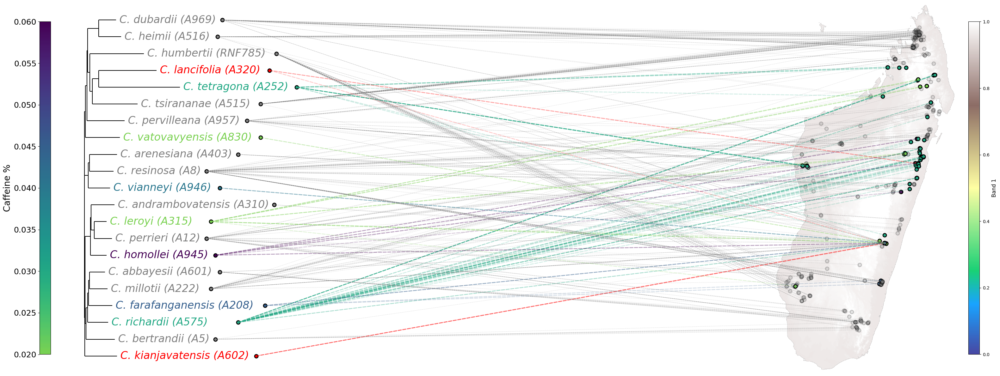

In [31]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
import matplotlib.cm as cm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import numpy as np
from Bio import Phylo
import argparse
import rasterio
from rasterio.plot import show

label_map = {
    "C_abbayesii_A601": "C. abbayesii (A601)",
    "C_ambodirianensis_A572": "C. ambodirianensis (A572)",
    "C_ambongensis": "C. ambongensis",
    "C_andrambovatensis_A310": "C. andrambovatensis (A310)",
    "C_ankaranensis_A525": "C. ankaranensis (A525)",
    "C_arenesiana_A403": "C. arenesiana (A403)",
    "C_augagneuri_A966": "C. augagneuri (A966)",
    "C_bernardiniana_MDC": "C. bernardiniana (MDC)",
    "C_bertrandii_A5": "C. bertrandii (A5)",
    "C_bissetiae": "C. bissetiae",
    "C_boinensis": "C. boinensis",
    "C_boiviniana_A980": "C. boiviniana (A980)",
    "C_bonnieri_A535": "C. bonnieri (A535)",
    "C_costei_A956": "C. costei (A956)",
    "C_dolichophylla_A206": "C. dolichophylla (A206)",
    "C_dubardii_A969": "C. dubardii (A969)",
    "C_farafanganensis_A208": "C. farafanganensis (A208)",
    "C_heimii_A516": "C. heimii (A516)",
    "C_homollei_A945": "C. homollei (A945)",
    "C_humbertii_RNF785": "C. humbertii (RNF785)",
    "C_humblotiana_BM19_20": "C. humblotiana (BM19, 20)",
    "C_jumellei_A974": "C. jumellei (A974)",
    "C_kianjavatensis_A602": "C. kianjavatensis (A602)",
    "C_kihansiensis_APD2922": "C. kihansiensis (APD2922)",
    "C_labatii_APD3096": "C. labatii (APD3096)",
    "C_lancifolia_A320": "C. lancifolia (A320)",
    "C_leroyi_A315": "C. leroyi (A315)",
    "C_liaudii_A1013": "C. liaudii (A1013)",
    "C_macrocarpa-PET": "C. macrocarpa (PET)",
    "C_mauritiana_BM17_25": "C. mauritiana (BM17, 25)",
    "C_mauritiana_Makes4": "C. mauritiana (Makes4)",
    "C_mcphersonii_A977": "C. mcphersonii (A977)",
    "C_millotii_A222": "C. millotii (A222)",
    "C_mogeneti_A975": "C. mogeneti (A975)",
    "C_montis-sacri_A321": "C. montis-sacri (A321)",
    "C_myrtifolia_MBR_A9": "C. myrtifolia (MBR, A9)",
    "C_perrieri_A12": "C. perrieri (A12)",
    "C_pervilleana_A957": "C. pervilleana (A957)",
    "C_ratsimamangae_A528": "C. ratsimamangae (A528)",
    "C_resinosa_A8": "C. resinosa (A8)",
    "C_richardii_A575": "C. richardii (A575)",
    "C_sahafaryensis_A978": "C. sahafaryensis (A978)",
    "C_sakarahae_A304": "C. sakarahae (A304)",
    "C_tetragona_A252": "C. tetragona (A252)",
    "C_tsirananae_A515": "C. tsirananae (A515)",
    "C_vatovavyensis_A830": "C. vatovavyensis (A830)",
    "C_vianneyi_A946": "C. vianneyi (A946)",
    "Tricalysia": "C. Tricalysia",
}


def custom_label(clade):
    if clade.is_terminal():
        # return clade.name
        return label_map.get(clade.name, clade.name)
    else:
        return None


def calc_node_positions(tree, x_start, x_end, y_start, y_step):
    if tree.is_terminal():
        x_pos = x_start
        y_pos = y_start
        y_start += y_step
    else:
        x_pos = (x_start + x_end) / 2
        y_pos = y_start

        child_y_start = y_start
        for child in tree.clades:
            child_x_pos, child_y_pos, y_start = calc_node_positions(
                child, x_start, x_end, y_start, y_step
            )
            x_start = child_x_pos

        y_pos = (y_start + child_y_start) / 2

    tree.position = (x_pos, y_pos)
    return x_pos, y_pos, y_start


def get_x_offset(node_name, offsets_dict):
    return offsets_dict.get(node_name, 0)  # default offset is 0 if not found


def plot_adjusted_node(ax, node, y_offset, offsets_dict, gps):
    x, y = node.position
    x_offset = get_x_offset(node.name, offsets_dict)
    x += x_offset
    y += y_offset

    # Default color if node name is not found
    color = "grey"

    # Check if node name is in the gps DataFrame and set color accordingly
    if node.name in gps["specimen_id"].values:
        color = gps[gps["specimen_id"] == node.name]["color"].values[0]

    ax.plot(
        x,
        y,
        "o",
        markersize=8,
        markerfacecolor=color,
        markeredgewidth=2,
        markeredgecolor="black",
    )
    return x, y


def value_to_color_old(val):
    if val == 0.00:
        return "grey"
    elif 0.00 < val < 0.7:
        base_cmap = plt.get_cmap("viridis")
        newcolors = base_cmap(np.linspace(0, 0.8, 256))
        viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
        cmap = viridis_no_yellow
        norm = mcolors.Normalize(vmin=0.02, vmax=0.06)
        return mcolors.to_hex(cmap(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def value_to_color_v03(val):
    color_map = {
        1: "red",
        2: "blue",
        0.00: "green",
        4: "purple",
        5: "orange",
        6: "cyan",
        0.7: "magenta",
        0.8: "grey",
        0.9: "brown",
    }
    return color_map.get(
        val, "black"
    )  # Default to 'grey' if the value is not in the dictionary


base = plt.get_cmap("viridis")
newcols = base(np.linspace(0, 0.8, 256))
cmap_noy = mcolors.ListedColormap(newcols, name="viridis_no_yellow")
cmap_rev = cmap_noy.reversed()
norm = mcolors.Normalize(vmin=0.02, vmax=0.06)


def value_to_color(val):
    if val == 0.0:
        return "grey"
    elif 0.0 < val < 0.7:
        return mcolors.to_hex(cmap_rev(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def main():
    # Path to your raster file - UPDATE THIS PATH
    raster_file = r"..\input\madaclim_enviro.tif"  # e.g., elevation, satellite, etc.
    raster_band = 1  # Which band to display (1-indexed)
    raster_cmap = "terrain"  # Colormap for raster: "terrain", "viridis", "gray", etc.

    # parser = argparse.ArgumentParser(description="PhyloCartoPlot Main script")
    # parser.add_argument(
    #     "--nwk", type=str, required=True, help="Path to the file for tree in nwk format"
    # )
    # parser.add_argument(
    #     "--gps", type=str, required=True, help="Path to the file for gps coordinates"
    # )
    # parser.add_argument(
    #     "--offset", type=str, required=True, help="Path to the file for ajustments"
    # )

    # args = parser.parse_args()

    # Create a new map with PlateCarree projection
    fig = plt.figure(figsize=(35, 12))

    # --------------------------------------
    # ------------  Phylogenetic MAP -------
    # --------------------------------------

    # Load the tree
    # tree = Phylo.read(args.nwk, "newick")
    tree = Phylo.read(nwk_file, "newick")

    # Load offsets from CSV
    # offsets_df = pd.read_csv(args.offset)
    offsets_df = pd.read_csv(offsets_file)

    offsets_dict = pd.Series(
        offsets_df.XOffset.values, index=offsets_df.NodeName
    ).to_dict()

    # Calculate positions for all nodes
    y_step = 1
    calc_node_positions(tree.root, 0, 1, 0, y_step)

    # Create a figure for the subplot
    ax_tree = fig.add_subplot(121)

    # gps = pd.read_csv(args.gps)
    gps = pd.read_csv(gps_coords)

    gps["color"] = gps["caffeine_percent"].apply(value_to_color)
    # text_colors = dict(zip(gps["specimen_id"], gps["color"]))
    # raw_color_map = dict(zip(gps["specimen_id"], gps["color"]))

    # # build a map from *displayed* label → color
    # text_colors = {label_map.get(raw, raw): col for raw, col in raw_color_map.items()}

    valmap = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    # 2) ta cmap "no yellow" et sa version inversée
    base = plt.get_cmap("viridis")
    newcolors = base(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap_rev = viridis_no_yellow.reversed()

    # 3) la normalisation
    norm = mcolors.Normalize(vmin=0.02, vmax=0.06)

    # 4) construction de text_colors en gardant grey pour 0.0
    text_colors = {
        label_map.get(raw, raw): (
            "grey"
            if valmap[raw] == 0.0
            else (
                mcolors.to_hex(cmap_rev(norm(valmap[raw])))  # 0<val<0.7 → reversed cmap
                if 0.0 < valmap[raw] < 0.7
                else "red" if valmap[raw] == 0.7 else "black"
            )
        )
        for raw in gps["specimen_id"]
    }

    # Plot the tree
    Phylo.draw(
        tree,
        do_show=False,
        axes=ax_tree,
        label_func=custom_label,
        label_colors=text_colors,
    )

    for txt in ax_tree.texts:
        txt.set_fontsize(24)
        txt.set_fontstyle("italic")

    # ax_tree.set_title("Coffea species with their geolocation per caffeine content", fontsize=18)
    ax_tree.set_frame_on(False)  # Remove the border/frame
    ax_tree.axis("off")  # Turn off the axes, including ticks and labels
    # Set axes limits to verify the data range
    ax_tree.set_xlim(-0.05, 1)
    ax_tree.set_ylim(0, max(node.position[1] for node in tree.get_terminals()) + 2)

    node_positions = {clade.name: clade.position for clade in tree.find_clades()}

    # Generate DataFrame with node coordinates (commented out as unnecessary here)
    rows = []
    for clade in tree.find_clades():
        if clade.is_terminal():
            label = clade.name
            x, y = plot_adjusted_node(
                ax_tree, clade, y_step, offsets_dict, gps
            )  # Adjust offsets if necessary
            rows.append([label, (x, y)])

    # Create DataFrame with node coordinates (commented out as unnecessary here)
    df = pd.DataFrame(rows, columns=["ID", "Coordinates"])

    # --------------------------------------
    # ------------ RASTER MAP (instead of coastlines) -------
    # --------------------------------------

    # Create subplot 2 with the map plot
    ax2 = fig.add_subplot(122, projection=ccrs.PlateCarree())
    extent = [43, 51, -27, -11]
    ax2.set_extent(extent)
    
    # Remove border/frame from ax2
    ax2.set_frame_on(False)
    ax2.axis("off")

    # ======== RASTERIO: Load and display raster band ========
    try:
        with rasterio.open(raster_file) as src:
            # Print raster info for debugging
            print(f"Raster file: {raster_file}")
            print(f"Number of bands: {src.count}")
            print(f"CRS: {src.crs}")
            print(f"Bounds: {src.bounds}")
            
            # Get band metadata for label
            band_description = src.descriptions[raster_band - 1]  # descriptions is 0-indexed
            if not band_description or band_description.strip() == "":
                # Try to get from tags
                band_tags = src.tags(raster_band)
                band_description = band_tags.get('name', f"Band {raster_band}")
            
            print(f"Band {raster_band} description: {band_description}")
            
            # Read the specified band
            raster_data = src.read(raster_band)
            
            # ===== CONTRAST ENHANCEMENT =====
            # Stretch contrast using percentiles (2% to 98%)
            vmin = np.percentile(raster_data, 2)
            vmax = np.percentile(raster_data, 98)
            
            # Normalize raster data for better contrast
            raster_normalized = np.clip((raster_data - vmin) / (vmax - vmin), 0, 1)
            
            # ===== MASK WATER (set to NaN where water is) =====
            # Create a masked array - set invalid/water pixels to NaN
            # Adjust the threshold based on your raster (water typically has low/negative values)
            raster_masked = raster_normalized.copy().astype(float)
            raster_masked[raster_data < 0] = np.nan  # Mask negative values (water in DEM)
            
            # Plot the raster on the cartopy map
            im = ax2.imshow(
                raster_masked,
                transform=ccrs.PlateCarree(),
                cmap=raster_cmap,
                extent=extent,
                origin="upper",
                alpha=0.9,  # Semi-transparent so data points show through
                vmin=0,
                vmax=1,
            )
            
            # Add land borders on top to define the region clearly
            ax2.add_feature(cfeature.BORDERS, linewidth=0.5, edgecolor='black')
            
            # Add colorbar for the raster on the right side
            cbar_raster = fig.colorbar(
                im,
                ax=ax2,
                orientation="vertical",
                pad=0.02,
                location="right",
                shrink=0.9,
                aspect=30,
                label=band_description,
            )
            cbar_raster.set_label(band_description, fontsize=12)
            cbar_raster.ax.tick_params(labelsize=10)
            
    except Exception as e:
        print(f"Error loading raster file: {e}")
        print(f"Falling back to default map features...")
        # Fallback to coastlines if raster fails
        ax2.coastlines(resolution="10m")
        ax2.add_feature(cfeature.LAND)
        ax2.add_feature(cfeature.OCEAN)
        ax2.add_feature(cfeature.COASTLINE)
        ax2.add_feature(cfeature.BORDERS)

    # Plot points from GPS dataframe on top of raster
    for _, row in gps.iterrows():
        is_zero = row["caffeine_percent"] == 0.0
        ax2.plot(
            row["longitude"],
            row["latitude"],
            "o",
            markersize=8,
            markerfacecolor=row["color"],
            markeredgewidth=2,
            markeredgecolor="black",
            alpha=0.2 if is_zero else 1.0,  # ← 50% transparent grey dots
        )

    # ax2.set_xlabel("Longitude")
    # ax2.set_ylabel("Latitude")
    # ax2.spines["geo"].set_visible(False)

    legend_handles = [
        mlines.Line2D(
            [], [], color="grey", marker="o", linestyle="None", label="0% caffeine"
        ),
        mlines.Line2D(
            [],
            [],
            color="purple",
            marker="o",
            linestyle="None",
            label="0.02–0.06% caffeine",
        ),
        mlines.Line2D(
            [], [], color="red", marker="o", linestyle="None", label="0.7% caffeine"
        ),
    ]
    # ax2.legend(
    #     handles=legend_handles,
    #     loc="lower right",
    #     frameon=True,
    #     fontsize=12,
    # )

    # build a ScalarMappable for your viridis gradient
    base_cmap = plt.get_cmap("viridis")
    newcolors = base_cmap(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap = viridis_no_yellow.reversed()

    norm = mpl.colors.Normalize(vmin=0.02, vmax=0.06)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

    cbar = fig.colorbar(
        sm,
        ax=ax_tree,
        orientation="vertical",  # or 'horizontal'
        pad=0.02,  # spacing between plot and bar
        location="left",  # ← put bar on the left
        shrink=0.9,  # shorten it to 70% of the axes height
        aspect=30,  # make it thinner (higher → thinner)
    )
    cbar.set_label("Caffeine %", fontsize=20)
    cbar.ax.tick_params(labelsize=18)

    # --------------------------------------
    # ------------  Line mapping -----------
    # --------------------------------------

    # Group gps DataFrame by ID and create a dictionary of lists of coordinates
    gps_grouped = (
        gps.groupby("specimen_id")[["longitude", "latitude", "color"]]
        .apply(lambda x: list(zip(x["longitude"], x["latitude"], x["color"])))
        .to_dict()
    )
    caff_dict = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    for index, row in df.iterrows():
        specimen = row["ID"]
        if specimen in gps_grouped:
            for longitude, latitude, color in gps_grouped[specimen]:
                caf = caff_dict.get(specimen, 0.0)
                lw = 2.0 if caf > 0 else 0.8
                # if the line is grey (0% caffeine) make it 50% opaque, else keep your 0.2
                line_alpha = 0.2 if color == "grey" else 0.2

                con = ConnectionPatch(
                    xyA=row["Coordinates"],
                    coordsA="data",
                    xyB=(longitude, latitude),
                    coordsB="data",
                    axesA=ax_tree,
                    axesB=ax2,
                    color=color,
                    linewidth=lw,  # whatever logic you already have for line thickness
                    linestyle="--",
                    alpha=line_alpha,  # ← use our conditional transparency
                    zorder=2,
                )
                fig.add_artist(con)

    fig.subplots_adjust(wspace=1.5)
    plt.tight_layout()
    output_file = r"..\images\tree2_raster_map.svg"
    plt.savefig(output_file, format="svg", transparent=True, bbox_inches="tight", pad_inches=0.1)
    output_file = r"..\images\tree2_raster_map.png"
    plt.savefig(output_file, format="png", transparent=True)
    plt.show()
    plt.close(fig)


if __name__ == "__main__":
    main()

    # nwk_file = r"..\input\aligned_caffeine_tree.nwk"
    # gps_coords = r'..\tmp\file_w_caffeine.csv'
    # offsets_file = r"..\input\offsets_caff.csv"
# example use
# python .\tree_to_map_caffeine_content.py --nwk nwk_file --gps gps_coords --offset offsets_file

Raster file: ..\input\madaclim_enviro.tif
Number of bands: 9
CRS: EPSG:32738
Bounds: BoundingBox(left=298000.0, bottom=7155000.0, right=1101000.0, top=8683000.0)


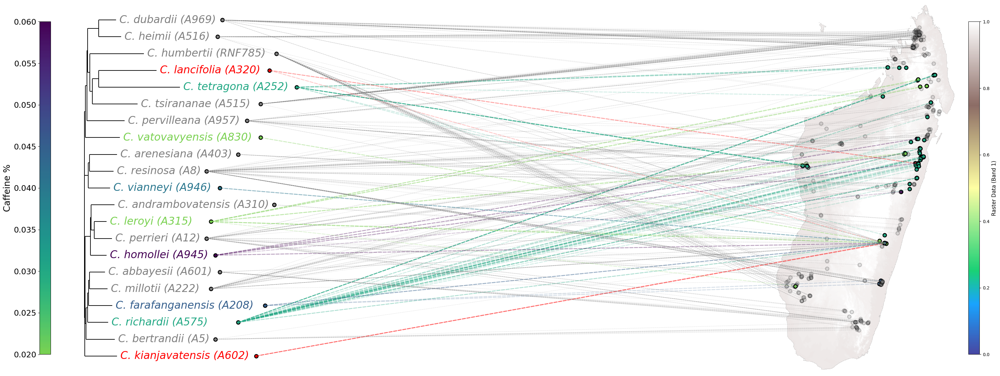

In [30]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
import matplotlib.cm as cm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import numpy as np
from Bio import Phylo
import argparse
import rasterio
from rasterio.plot import show

label_map = {
    "C_abbayesii_A601": "C. abbayesii (A601)",
    "C_ambodirianensis_A572": "C. ambodirianensis (A572)",
    "C_ambongensis": "C. ambongensis",
    "C_andrambovatensis_A310": "C. andrambovatensis (A310)",
    "C_ankaranensis_A525": "C. ankaranensis (A525)",
    "C_arenesiana_A403": "C. arenesiana (A403)",
    "C_augagneuri_A966": "C. augagneuri (A966)",
    "C_bernardiniana_MDC": "C. bernardiniana (MDC)",
    "C_bertrandii_A5": "C. bertrandii (A5)",
    "C_bissetiae": "C. bissetiae",
    "C_boinensis": "C. boinensis",
    "C_boiviniana_A980": "C. boiviniana (A980)",
    "C_bonnieri_A535": "C. bonnieri (A535)",
    "C_costei_A956": "C. costei (A956)",
    "C_dolichophylla_A206": "C. dolichophylla (A206)",
    "C_dubardii_A969": "C. dubardii (A969)",
    "C_farafanganensis_A208": "C. farafanganensis (A208)",
    "C_heimii_A516": "C. heimii (A516)",
    "C_homollei_A945": "C. homollei (A945)",
    "C_humbertii_RNF785": "C. humbertii (RNF785)",
    "C_humblotiana_BM19_20": "C. humblotiana (BM19, 20)",
    "C_jumellei_A974": "C. jumellei (A974)",
    "C_kianjavatensis_A602": "C. kianjavatensis (A602)",
    "C_kihansiensis_APD2922": "C. kihansiensis (APD2922)",
    "C_labatii_APD3096": "C. labatii (APD3096)",
    "C_lancifolia_A320": "C. lancifolia (A320)",
    "C_leroyi_A315": "C. leroyi (A315)",
    "C_liaudii_A1013": "C. liaudii (A1013)",
    "C_macrocarpa-PET": "C. macrocarpa (PET)",
    "C_mauritiana_BM17_25": "C. mauritiana (BM17, 25)",
    "C_mauritiana_Makes4": "C. mauritiana (Makes4)",
    "C_mcphersonii_A977": "C. mcphersonii (A977)",
    "C_millotii_A222": "C. millotii (A222)",
    "C_mogeneti_A975": "C. mogeneti (A975)",
    "C_montis-sacri_A321": "C. montis-sacri (A321)",
    "C_myrtifolia_MBR_A9": "C. myrtifolia (MBR, A9)",
    "C_perrieri_A12": "C. perrieri (A12)",
    "C_pervilleana_A957": "C. pervilleana (A957)",
    "C_ratsimamangae_A528": "C. ratsimamangae (A528)",
    "C_resinosa_A8": "C. resinosa (A8)",
    "C_richardii_A575": "C. richardii (A575)",
    "C_sahafaryensis_A978": "C. sahafaryensis (A978)",
    "C_sakarahae_A304": "C. sakarahae (A304)",
    "C_tetragona_A252": "C. tetragona (A252)",
    "C_tsirananae_A515": "C. tsirananae (A515)",
    "C_vatovavyensis_A830": "C. vatovavyensis (A830)",
    "C_vianneyi_A946": "C. vianneyi (A946)",
    "Tricalysia": "C. Tricalysia",
}


def custom_label(clade):
    if clade.is_terminal():
        # return clade.name
        return label_map.get(clade.name, clade.name)
    else:
        return None


def calc_node_positions(tree, x_start, x_end, y_start, y_step):
    if tree.is_terminal():
        x_pos = x_start
        y_pos = y_start
        y_start += y_step
    else:
        x_pos = (x_start + x_end) / 2
        y_pos = y_start

        child_y_start = y_start
        for child in tree.clades:
            child_x_pos, child_y_pos, y_start = calc_node_positions(
                child, x_start, x_end, y_start, y_step
            )
            x_start = child_x_pos

        y_pos = (y_start + child_y_start) / 2

    tree.position = (x_pos, y_pos)
    return x_pos, y_pos, y_start


def get_x_offset(node_name, offsets_dict):
    return offsets_dict.get(node_name, 0)  # default offset is 0 if not found


def plot_adjusted_node(ax, node, y_offset, offsets_dict, gps):
    x, y = node.position
    x_offset = get_x_offset(node.name, offsets_dict)
    x += x_offset
    y += y_offset

    # Default color if node name is not found
    color = "grey"

    # Check if node name is in the gps DataFrame and set color accordingly
    if node.name in gps["specimen_id"].values:
        color = gps[gps["specimen_id"] == node.name]["color"].values[0]

    ax.plot(
        x,
        y,
        "o",
        markersize=8,
        markerfacecolor=color,
        markeredgewidth=2,
        markeredgecolor="black",
    )
    return x, y


def value_to_color_old(val):
    if val == 0.00:
        return "grey"
    elif 0.00 < val < 0.7:
        base_cmap = plt.get_cmap("viridis")
        newcolors = base_cmap(np.linspace(0, 0.8, 256))
        viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
        cmap = viridis_no_yellow
        norm = mcolors.Normalize(vmin=0.02, vmax=0.06)
        return mcolors.to_hex(cmap(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def value_to_color_v03(val):
    color_map = {
        1: "red",
        2: "blue",
        0.00: "green",
        4: "purple",
        5: "orange",
        6: "cyan",
        0.7: "magenta",
        0.8: "grey",
        0.9: "brown",
    }
    return color_map.get(
        val, "black"
    )  # Default to 'grey' if the value is not in the dictionary


base = plt.get_cmap("viridis")
newcols = base(np.linspace(0, 0.8, 256))
cmap_noy = mcolors.ListedColormap(newcols, name="viridis_no_yellow")
cmap_rev = cmap_noy.reversed()
norm = mcolors.Normalize(vmin=0.02, vmax=0.06)


def value_to_color(val):
    if val == 0.0:
        return "grey"
    elif 0.0 < val < 0.7:
        return mcolors.to_hex(cmap_rev(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def main():
    # Path to your raster file - UPDATE THIS PATH
    raster_file = r"..\input\madaclim_enviro.tif"  # e.g., elevation, satellite, etc.
    raster_band = 1  # Which band to display (1-indexed)
    raster_cmap = "terrain"  # Colormap for raster: "terrain", "viridis", "gray", etc.

    # parser = argparse.ArgumentParser(description="PhyloCartoPlot Main script")
    # parser.add_argument(
    #     "--nwk", type=str, required=True, help="Path to the file for tree in nwk format"
    # )
    # parser.add_argument(
    #     "--gps", type=str, required=True, help="Path to the file for gps coordinates"
    # )
    # parser.add_argument(
    #     "--offset", type=str, required=True, help="Path to the file for ajustments"
    # )

    # args = parser.parse_args()

    # Create a new map with PlateCarree projection
    fig = plt.figure(figsize=(35, 12))

    # --------------------------------------
    # ------------  Phylogenetic MAP -------
    # --------------------------------------

    # Load the tree
    # tree = Phylo.read(args.nwk, "newick")
    tree = Phylo.read(nwk_file, "newick")

    # Load offsets from CSV
    # offsets_df = pd.read_csv(args.offset)
    offsets_df = pd.read_csv(offsets_file)

    offsets_dict = pd.Series(
        offsets_df.XOffset.values, index=offsets_df.NodeName
    ).to_dict()

    # Calculate positions for all nodes
    y_step = 1
    calc_node_positions(tree.root, 0, 1, 0, y_step)

    # Create a figure for the subplot
    ax_tree = fig.add_subplot(121)

    # gps = pd.read_csv(args.gps)
    gps = pd.read_csv(gps_coords)

    gps["color"] = gps["caffeine_percent"].apply(value_to_color)
    # text_colors = dict(zip(gps["specimen_id"], gps["color"]))
    # raw_color_map = dict(zip(gps["specimen_id"], gps["color"]))

    # # build a map from *displayed* label → color
    # text_colors = {label_map.get(raw, raw): col for raw, col in raw_color_map.items()}

    valmap = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    # 2) ta cmap "no yellow" et sa version inversée
    base = plt.get_cmap("viridis")
    newcolors = base(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap_rev = viridis_no_yellow.reversed()

    # 3) la normalisation
    norm = mcolors.Normalize(vmin=0.02, vmax=0.06)

    # 4) construction de text_colors en gardant grey pour 0.0
    text_colors = {
        label_map.get(raw, raw): (
            "grey"
            if valmap[raw] == 0.0
            else (
                mcolors.to_hex(cmap_rev(norm(valmap[raw])))  # 0<val<0.7 → reversed cmap
                if 0.0 < valmap[raw] < 0.7
                else "red" if valmap[raw] == 0.7 else "black"
            )
        )
        for raw in gps["specimen_id"]
    }

    # Plot the tree
    Phylo.draw(
        tree,
        do_show=False,
        axes=ax_tree,
        label_func=custom_label,
        label_colors=text_colors,
    )

    for txt in ax_tree.texts:
        txt.set_fontsize(24)
        txt.set_fontstyle("italic")

    # ax_tree.set_title("Coffea species with their geolocation per caffeine content", fontsize=18)
    ax_tree.set_frame_on(False)  # Remove the border/frame
    ax_tree.axis("off")  # Turn off the axes, including ticks and labels
    # Set axes limits to verify the data range
    ax_tree.set_xlim(-0.05, 1)
    ax_tree.set_ylim(0, max(node.position[1] for node in tree.get_terminals()) + 2)

    node_positions = {clade.name: clade.position for clade in tree.find_clades()}

    # Generate DataFrame with node coordinates (commented out as unnecessary here)
    rows = []
    for clade in tree.find_clades():
        if clade.is_terminal():
            label = clade.name
            x, y = plot_adjusted_node(
                ax_tree, clade, y_step, offsets_dict, gps
            )  # Adjust offsets if necessary
            rows.append([label, (x, y)])

    # Create DataFrame with node coordinates (commented out as unnecessary here)
    df = pd.DataFrame(rows, columns=["ID", "Coordinates"])

    # --------------------------------------
    # ------------ RASTER MAP (instead of coastlines) -------
    # --------------------------------------

    # Create subplot 2 with the map plot
    ax2 = fig.add_subplot(122, projection=ccrs.PlateCarree())
    extent = [43, 51, -27, -11]
    ax2.set_extent(extent)

    # ======== RASTERIO: Load and display raster band ========
    try:
        with rasterio.open(raster_file) as src:
            # Print raster info for debugging
            print(f"Raster file: {raster_file}")
            print(f"Number of bands: {src.count}")
            print(f"CRS: {src.crs}")
            print(f"Bounds: {src.bounds}")
            
            # Read the specified band
            raster_data = src.read(raster_band)
            
            # ===== CONTRAST ENHANCEMENT =====
            # Stretch contrast using percentiles (2% to 98%)
            vmin = np.percentile(raster_data, 2)
            vmax = np.percentile(raster_data, 98)
            
            # Normalize raster data for better contrast
            raster_normalized = np.clip((raster_data - vmin) / (vmax - vmin), 0, 1)
            
            # ===== MASK WATER (set to NaN where water is) =====
            # Create a masked array - set invalid/water pixels to NaN
            # Adjust the threshold based on your raster (water typically has low/negative values)
            raster_masked = raster_normalized.copy().astype(float)
            raster_masked[raster_data < 0] = np.nan  # Mask negative values (water in DEM)
            
            # Plot the raster on the cartopy map
            im = ax2.imshow(
                raster_masked,
                transform=ccrs.PlateCarree(),
                cmap=raster_cmap,
                extent=extent,
                origin="upper",
                alpha=0.9,  # Semi-transparent so data points show through
                vmin=0,
                vmax=1,
            )
            
            # Add land borders on top to define the region clearly
            ax2.add_feature(cfeature.BORDERS, linewidth=0.5, edgecolor='black')
            ax2.set_frame_on(False)  # Remove the border/frame
            ax2.axis("off")  # Turn off the axes, including ticks and labels
            # Add colorbar for the raster on the right side
            cbar_raster = fig.colorbar(
                im,
                ax=ax2,
                orientation="vertical",
                pad=0.02,
                location="right",
                shrink=0.9,
                aspect=30,
                label="Raster Data (Band {})".format(raster_band),
            )
            cbar_raster.set_label("Raster Data (Band {})".format(raster_band), fontsize=12)
            cbar_raster.ax.tick_params(labelsize=10)
            
    except Exception as e:
        print(f"Error loading raster file: {e}")
        print(f"Falling back to default map features...")
        # Fallback to coastlines if raster fails
        ax2.coastlines(resolution="10m")
        ax2.add_feature(cfeature.LAND)
        ax2.add_feature(cfeature.OCEAN)
        ax2.add_feature(cfeature.COASTLINE)
        ax2.add_feature(cfeature.BORDERS)

    # Plot points from GPS dataframe on top of raster
    for _, row in gps.iterrows():
        is_zero = row["caffeine_percent"] == 0.0
        ax2.plot(
            row["longitude"],
            row["latitude"],
            "o",
            markersize=8,
            markerfacecolor=row["color"],
            markeredgewidth=2,
            markeredgecolor="black",
            alpha=0.2 if is_zero else 1.0,  # ← 50% transparent grey dots
        )

    # ax2.set_xlabel("Longitude")
    # ax2.set_ylabel("Latitude")
    # ax2.spines["geo"].set_visible(False)

    legend_handles = [
        mlines.Line2D(
            [], [], color="grey", marker="o", linestyle="None", label="0% caffeine"
        ),
        mlines.Line2D(
            [],
            [],
            color="purple",
            marker="o",
            linestyle="None",
            label="0.02–0.06% caffeine",
        ),
        mlines.Line2D(
            [], [], color="red", marker="o", linestyle="None", label="0.7% caffeine"
        ),
    ]
    # ax2.legend(
    #     handles=legend_handles,
    #     loc="lower right",
    #     frameon=True,
    #     fontsize=12,
    # )

    # build a ScalarMappable for your viridis gradient
    base_cmap = plt.get_cmap("viridis")
    newcolors = base_cmap(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap = viridis_no_yellow.reversed()

    norm = mpl.colors.Normalize(vmin=0.02, vmax=0.06)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

    cbar = fig.colorbar(
        sm,
        ax=ax_tree,
        orientation="vertical",  # or 'horizontal'
        pad=0.02,  # spacing between plot and bar
        location="left",  # ← put bar on the left
        shrink=0.9,  # shorten it to 70% of the axes height
        aspect=30,  # make it thinner (higher → thinner)
    )
    cbar.set_label("Caffeine %", fontsize=20)
    cbar.ax.tick_params(labelsize=18)

    # --------------------------------------
    # ------------  Line mapping -----------
    # --------------------------------------

    # Group gps DataFrame by ID and create a dictionary of lists of coordinates
    gps_grouped = (
        gps.groupby("specimen_id")[["longitude", "latitude", "color"]]
        .apply(lambda x: list(zip(x["longitude"], x["latitude"], x["color"])))
        .to_dict()
    )
    caff_dict = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    for index, row in df.iterrows():
        specimen = row["ID"]
        if specimen in gps_grouped:
            for longitude, latitude, color in gps_grouped[specimen]:
                caf = caff_dict.get(specimen, 0.0)
                lw = 2.0 if caf > 0 else 0.8
                # if the line is grey (0% caffeine) make it 50% opaque, else keep your 0.2
                line_alpha = 0.2 if color == "grey" else 0.2

                con = ConnectionPatch(
                    xyA=row["Coordinates"],
                    coordsA="data",
                    xyB=(longitude, latitude),
                    coordsB="data",
                    axesA=ax_tree,
                    axesB=ax2,
                    color=color,
                    linewidth=lw,  # whatever logic you already have for line thickness
                    linestyle="--",
                    alpha=line_alpha,  # ← use our conditional transparency
                    zorder=2,
                )
                fig.add_artist(con)

    fig.subplots_adjust(wspace=1.5)
    plt.tight_layout()
    output_file = r"..\images\tree2_raster_map.svg"
    plt.savefig(output_file, format="svg", transparent=True, bbox_inches="tight", pad_inches=0.1)
    output_file = r"..\images\tree2_raster_map.png"
    plt.savefig(output_file, format="png", transparent=True)
    plt.show()
    plt.close(fig)


if __name__ == "__main__":
    main()

    # nwk_file = r"..\input\aligned_caffeine_tree.nwk"
    # gps_coords = r'..\tmp\file_w_caffeine.csv'
    # offsets_file = r"..\input\offsets_caff.csv"
# example use
# python .\tree_to_map_caffeine_content.py --nwk nwk_file --gps gps_coords --offset offsets_file

Raster file: ..\input\madaclim_enviro.tif
Number of bands: 9
CRS: EPSG:32738
Bounds: BoundingBox(left=298000.0, bottom=7155000.0, right=1101000.0, top=8683000.0)


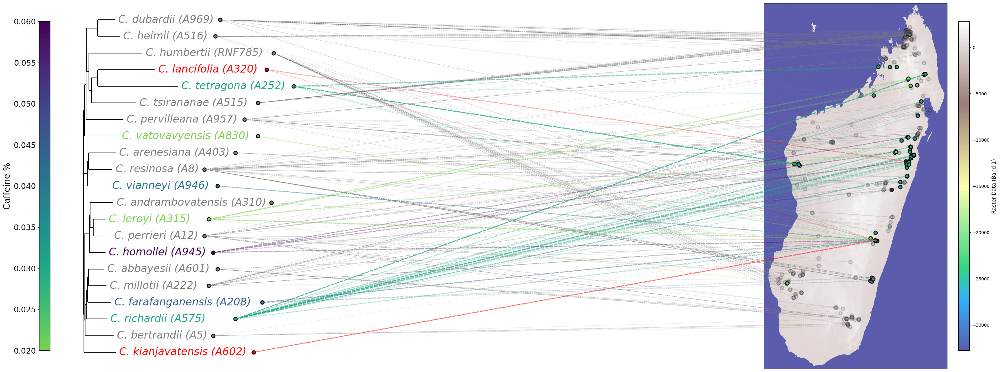

In [28]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
import matplotlib.cm as cm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import numpy as np
from Bio import Phylo
import argparse
import rasterio
from rasterio.plot import show

label_map = {
    "C_abbayesii_A601": "C. abbayesii (A601)",
    "C_ambodirianensis_A572": "C. ambodirianensis (A572)",
    "C_ambongensis": "C. ambongensis",
    "C_andrambovatensis_A310": "C. andrambovatensis (A310)",
    "C_ankaranensis_A525": "C. ankaranensis (A525)",
    "C_arenesiana_A403": "C. arenesiana (A403)",
    "C_augagneuri_A966": "C. augagneuri (A966)",
    "C_bernardiniana_MDC": "C. bernardiniana (MDC)",
    "C_bertrandii_A5": "C. bertrandii (A5)",
    "C_bissetiae": "C. bissetiae",
    "C_boinensis": "C. boinensis",
    "C_boiviniana_A980": "C. boiviniana (A980)",
    "C_bonnieri_A535": "C. bonnieri (A535)",
    "C_costei_A956": "C. costei (A956)",
    "C_dolichophylla_A206": "C. dolichophylla (A206)",
    "C_dubardii_A969": "C. dubardii (A969)",
    "C_farafanganensis_A208": "C. farafanganensis (A208)",
    "C_heimii_A516": "C. heimii (A516)",
    "C_homollei_A945": "C. homollei (A945)",
    "C_humbertii_RNF785": "C. humbertii (RNF785)",
    "C_humblotiana_BM19_20": "C. humblotiana (BM19, 20)",
    "C_jumellei_A974": "C. jumellei (A974)",
    "C_kianjavatensis_A602": "C. kianjavatensis (A602)",
    "C_kihansiensis_APD2922": "C. kihansiensis (APD2922)",
    "C_labatii_APD3096": "C. labatii (APD3096)",
    "C_lancifolia_A320": "C. lancifolia (A320)",
    "C_leroyi_A315": "C. leroyi (A315)",
    "C_liaudii_A1013": "C. liaudii (A1013)",
    "C_macrocarpa-PET": "C. macrocarpa (PET)",
    "C_mauritiana_BM17_25": "C. mauritiana (BM17, 25)",
    "C_mauritiana_Makes4": "C. mauritiana (Makes4)",
    "C_mcphersonii_A977": "C. mcphersonii (A977)",
    "C_millotii_A222": "C. millotii (A222)",
    "C_mogeneti_A975": "C. mogeneti (A975)",
    "C_montis-sacri_A321": "C. montis-sacri (A321)",
    "C_myrtifolia_MBR_A9": "C. myrtifolia (MBR, A9)",
    "C_perrieri_A12": "C. perrieri (A12)",
    "C_pervilleana_A957": "C. pervilleana (A957)",
    "C_ratsimamangae_A528": "C. ratsimamangae (A528)",
    "C_resinosa_A8": "C. resinosa (A8)",
    "C_richardii_A575": "C. richardii (A575)",
    "C_sahafaryensis_A978": "C. sahafaryensis (A978)",
    "C_sakarahae_A304": "C. sakarahae (A304)",
    "C_tetragona_A252": "C. tetragona (A252)",
    "C_tsirananae_A515": "C. tsirananae (A515)",
    "C_vatovavyensis_A830": "C. vatovavyensis (A830)",
    "C_vianneyi_A946": "C. vianneyi (A946)",
    "Tricalysia": "C. Tricalysia",
}


def custom_label(clade):
    if clade.is_terminal():
        # return clade.name
        return label_map.get(clade.name, clade.name)
    else:
        return None


def calc_node_positions(tree, x_start, x_end, y_start, y_step):
    if tree.is_terminal():
        x_pos = x_start
        y_pos = y_start
        y_start += y_step
    else:
        x_pos = (x_start + x_end) / 2
        y_pos = y_start

        child_y_start = y_start
        for child in tree.clades:
            child_x_pos, child_y_pos, y_start = calc_node_positions(
                child, x_start, x_end, y_start, y_step
            )
            x_start = child_x_pos

        y_pos = (y_start + child_y_start) / 2

    tree.position = (x_pos, y_pos)
    return x_pos, y_pos, y_start


def get_x_offset(node_name, offsets_dict):
    return offsets_dict.get(node_name, 0)  # default offset is 0 if not found


def plot_adjusted_node(ax, node, y_offset, offsets_dict, gps):
    x, y = node.position
    x_offset = get_x_offset(node.name, offsets_dict)
    x += x_offset
    y += y_offset

    # Default color if node name is not found
    color = "grey"

    # Check if node name is in the gps DataFrame and set color accordingly
    if node.name in gps["specimen_id"].values:
        color = gps[gps["specimen_id"] == node.name]["color"].values[0]

    ax.plot(
        x,
        y,
        "o",
        markersize=8,
        markerfacecolor=color,
        markeredgewidth=2,
        markeredgecolor="black",
    )
    return x, y


def value_to_color_old(val):
    if val == 0.00:
        return "grey"
    elif 0.00 < val < 0.7:
        base_cmap = plt.get_cmap("viridis")
        newcolors = base_cmap(np.linspace(0, 0.8, 256))
        viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
        cmap = viridis_no_yellow
        norm = mcolors.Normalize(vmin=0.02, vmax=0.06)
        return mcolors.to_hex(cmap(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def value_to_color_v03(val):
    color_map = {
        1: "red",
        2: "blue",
        0.00: "green",
        4: "purple",
        5: "orange",
        6: "cyan",
        0.7: "magenta",
        0.8: "grey",
        0.9: "brown",
    }
    return color_map.get(
        val, "black"
    )  # Default to 'grey' if the value is not in the dictionary


base = plt.get_cmap("viridis")
newcols = base(np.linspace(0, 0.8, 256))
cmap_noy = mcolors.ListedColormap(newcols, name="viridis_no_yellow")
cmap_rev = cmap_noy.reversed()
norm = mcolors.Normalize(vmin=0.02, vmax=0.06)


def value_to_color(val):
    if val == 0.0:
        return "grey"
    elif 0.0 < val < 0.7:
        return mcolors.to_hex(cmap_rev(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def main():
    # Path to your raster file - UPDATE THIS PATH
    raster_file = r"..\input\madaclim_enviro.tif"  # e.g., elevation, satellite, etc.
    raster_band = 1  # Which band to display (1-indexed)
    raster_cmap = "terrain"  # Colormap for raster: "terrain", "viridis", "gray", etc.

    # parser = argparse.ArgumentParser(description="PhyloCartoPlot Main script")
    # parser.add_argument(
    #     "--nwk", type=str, required=True, help="Path to the file for tree in nwk format"
    # )
    # parser.add_argument(
    #     "--gps", type=str, required=True, help="Path to the file for gps coordinates"
    # )
    # parser.add_argument(
    #     "--offset", type=str, required=True, help="Path to the file for ajustments"
    # )

    # args = parser.parse_args()

    # Create a new map with PlateCarree projection
    fig = plt.figure(figsize=(35, 12))

    # --------------------------------------
    # ------------  Phylogenetic MAP -------
    # --------------------------------------

    # Load the tree
    # tree = Phylo.read(args.nwk, "newick")
    tree = Phylo.read(nwk_file, "newick")

    # Load offsets from CSV
    # offsets_df = pd.read_csv(args.offset)
    offsets_df = pd.read_csv(offsets_file)

    offsets_dict = pd.Series(
        offsets_df.XOffset.values, index=offsets_df.NodeName
    ).to_dict()

    # Calculate positions for all nodes
    y_step = 1
    calc_node_positions(tree.root, 0, 1, 0, y_step)

    # Create a figure for the subplot
    ax_tree = fig.add_subplot(121)

    # gps = pd.read_csv(args.gps)
    gps = pd.read_csv(gps_coords)

    gps["color"] = gps["caffeine_percent"].apply(value_to_color)
    # text_colors = dict(zip(gps["specimen_id"], gps["color"]))
    # raw_color_map = dict(zip(gps["specimen_id"], gps["color"]))

    # # build a map from *displayed* label → color
    # text_colors = {label_map.get(raw, raw): col for raw, col in raw_color_map.items()}

    valmap = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    # 2) ta cmap "no yellow" et sa version inversée
    base = plt.get_cmap("viridis")
    newcolors = base(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap_rev = viridis_no_yellow.reversed()

    # 3) la normalisation
    norm = mcolors.Normalize(vmin=0.02, vmax=0.06)

    # 4) construction de text_colors en gardant grey pour 0.0
    text_colors = {
        label_map.get(raw, raw): (
            "grey"
            if valmap[raw] == 0.0
            else (
                mcolors.to_hex(cmap_rev(norm(valmap[raw])))  # 0<val<0.7 → reversed cmap
                if 0.0 < valmap[raw] < 0.7
                else "red" if valmap[raw] == 0.7 else "black"
            )
        )
        for raw in gps["specimen_id"]
    }

    # Plot the tree
    Phylo.draw(
        tree,
        do_show=False,
        axes=ax_tree,
        label_func=custom_label,
        label_colors=text_colors,
    )

    for txt in ax_tree.texts:
        txt.set_fontsize(24)
        txt.set_fontstyle("italic")

    # ax_tree.set_title("Coffea species with their geolocation per caffeine content", fontsize=18)
    ax_tree.set_frame_on(False)  # Remove the border/frame
    ax_tree.axis("off")  # Turn off the axes, including ticks and labels
    # Set axes limits to verify the data range
    ax_tree.set_xlim(-0.05, 1)
    ax_tree.set_ylim(0, max(node.position[1] for node in tree.get_terminals()) + 2)

    node_positions = {clade.name: clade.position for clade in tree.find_clades()}

    # Generate DataFrame with node coordinates (commented out as unnecessary here)
    rows = []
    for clade in tree.find_clades():
        if clade.is_terminal():
            label = clade.name
            x, y = plot_adjusted_node(
                ax_tree, clade, y_step, offsets_dict, gps
            )  # Adjust offsets if necessary
            rows.append([label, (x, y)])

    # Create DataFrame with node coordinates (commented out as unnecessary here)
    df = pd.DataFrame(rows, columns=["ID", "Coordinates"])

    # --------------------------------------
    # ------------ RASTER MAP (instead of coastlines) -------
    # --------------------------------------

    # Create subplot 2 with the map plot
    ax2 = fig.add_subplot(122, projection=ccrs.PlateCarree())
    extent = [43, 51, -27, -11]
    ax2.set_extent(extent)

    # ======== RASTERIO: Load and display raster band ========
    try:
        with rasterio.open(raster_file) as src:
            # Print raster info for debugging
            print(f"Raster file: {raster_file}")
            print(f"Number of bands: {src.count}")
            print(f"CRS: {src.crs}")
            print(f"Bounds: {src.bounds}")
            
            # Read the specified band
            raster_data = src.read(raster_band)
            
            # Plot the raster on the cartopy map
            im = ax2.imshow(
                raster_data,
                transform=ccrs.PlateCarree(),
                cmap=raster_cmap,
                extent=extent,
                origin="upper",
                alpha=0.8,  # Semi-transparent so data points show through
            )
            
            # Add colorbar for the raster on the right side
            cbar_raster = fig.colorbar(
                im,
                ax=ax2,
                orientation="vertical",
                pad=0.02,
                location="right",
                shrink=0.9,
                aspect=30,
                label="Raster Data (Band {})".format(raster_band),
            )
            cbar_raster.set_label("Raster Data (Band {})".format(raster_band), fontsize=12)
            cbar_raster.ax.tick_params(labelsize=10)
            
    except Exception as e:
        print(f"Error loading raster file: {e}")
        print(f"Falling back to default map features...")
        # Fallback to coastlines if raster fails
        ax2.coastlines(resolution="10m")
        ax2.add_feature(cfeature.LAND)
        ax2.add_feature(cfeature.OCEAN)
        ax2.add_feature(cfeature.COASTLINE)
        ax2.add_feature(cfeature.BORDERS)

    # Plot points from GPS dataframe on top of raster
    for _, row in gps.iterrows():
        is_zero = row["caffeine_percent"] == 0.0
        ax2.plot(
            row["longitude"],
            row["latitude"],
            "o",
            markersize=8,
            markerfacecolor=row["color"],
            markeredgewidth=2,
            markeredgecolor="black",
            alpha=0.2 if is_zero else 1.0,  # ← 50% transparent grey dots
        )

    # ax2.set_xlabel("Longitude")
    # ax2.set_ylabel("Latitude")
    # ax2.spines["geo"].set_visible(False)

    legend_handles = [
        mlines.Line2D(
            [], [], color="grey", marker="o", linestyle="None", label="0% caffeine"
        ),
        mlines.Line2D(
            [],
            [],
            color="purple",
            marker="o",
            linestyle="None",
            label="0.02–0.06% caffeine",
        ),
        mlines.Line2D(
            [], [], color="red", marker="o", linestyle="None", label="0.7% caffeine"
        ),
    ]
    # ax2.legend(
    #     handles=legend_handles,
    #     loc="lower right",
    #     frameon=True,
    #     fontsize=12,
    # )

    # build a ScalarMappable for your viridis gradient
    base_cmap = plt.get_cmap("viridis")
    newcolors = base_cmap(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap = viridis_no_yellow.reversed()

    norm = mpl.colors.Normalize(vmin=0.02, vmax=0.06)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

    cbar = fig.colorbar(
        sm,
        ax=ax_tree,
        orientation="vertical",  # or 'horizontal'
        pad=0.02,  # spacing between plot and bar
        location="left",  # ← put bar on the left
        shrink=0.9,  # shorten it to 70% of the axes height
        aspect=30,  # make it thinner (higher → thinner)
    )
    cbar.set_label("Caffeine %", fontsize=20)
    cbar.ax.tick_params(labelsize=18)

    # --------------------------------------
    # ------------  Line mapping -----------
    # --------------------------------------

    # Group gps DataFrame by ID and create a dictionary of lists of coordinates
    gps_grouped = (
        gps.groupby("specimen_id")[["longitude", "latitude", "color"]]
        .apply(lambda x: list(zip(x["longitude"], x["latitude"], x["color"])))
        .to_dict()
    )
    caff_dict = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    for index, row in df.iterrows():
        specimen = row["ID"]
        if specimen in gps_grouped:
            for longitude, latitude, color in gps_grouped[specimen]:
                caf = caff_dict.get(specimen, 0.0)
                lw = 2.0 if caf > 0 else 0.8
                # if the line is grey (0% caffeine) make it 50% opaque, else keep your 0.2
                line_alpha = 0.2 if color == "grey" else 0.2

                con = ConnectionPatch(
                    xyA=row["Coordinates"],
                    coordsA="data",
                    xyB=(longitude, latitude),
                    coordsB="data",
                    axesA=ax_tree,
                    axesB=ax2,
                    color=color,
                    linewidth=lw,  # whatever logic you already have for line thickness
                    linestyle="--",
                    alpha=line_alpha,  # ← use our conditional transparency
                    zorder=2,
                )
                fig.add_artist(con)

    fig.subplots_adjust(wspace=1.5)
    plt.tight_layout()
    output_file = r"..\images\tree2_raster_map.svg"
    plt.savefig(output_file, format="svg", transparent=True, bbox_inches="tight", pad_inches=0.1)
    output_file = r"..\images\tree2_raster_map.png"
    plt.savefig(output_file, format="png", transparent=True)
    plt.show()
    plt.close(fig)


if __name__ == "__main__":
    main()

    # nwk_file = r"..\input\aligned_caffeine_tree.nwk"
    # gps_coords = r'..\tmp\file_w_caffeine.csv'
    # offsets_file = r"..\input\offsets_caff.csv"
# example use
# python .\tree_to_map_caffeine_content.py --nwk nwk_file --gps gps_coords --offset offsets_file

Raster file: ..\input\madaclim_enviro.tif
Number of bands: 9
CRS: EPSG:32738
Bounds: BoundingBox(left=298000.0, bottom=7155000.0, right=1101000.0, top=8683000.0)


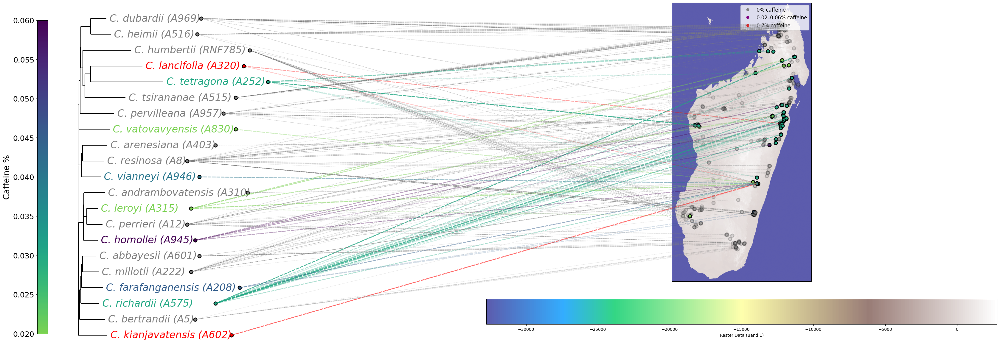

In [26]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
import matplotlib.cm as cm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import numpy as np
from Bio import Phylo
import argparse
import rasterio
from rasterio.plot import show

label_map = {
    "C_abbayesii_A601": "C. abbayesii (A601)",
    "C_ambodirianensis_A572": "C. ambodirianensis (A572)",
    "C_ambongensis": "C. ambongensis",
    "C_andrambovatensis_A310": "C. andrambovatensis (A310)",
    "C_ankaranensis_A525": "C. ankaranensis (A525)",
    "C_arenesiana_A403": "C. arenesiana (A403)",
    "C_augagneuri_A966": "C. augagneuri (A966)",
    "C_bernardiniana_MDC": "C. bernardiniana (MDC)",
    "C_bertrandii_A5": "C. bertrandii (A5)",
    "C_bissetiae": "C. bissetiae",
    "C_boinensis": "C. boinensis",
    "C_boiviniana_A980": "C. boiviniana (A980)",
    "C_bonnieri_A535": "C. bonnieri (A535)",
    "C_costei_A956": "C. costei (A956)",
    "C_dolichophylla_A206": "C. dolichophylla (A206)",
    "C_dubardii_A969": "C. dubardii (A969)",
    "C_farafanganensis_A208": "C. farafanganensis (A208)",
    "C_heimii_A516": "C. heimii (A516)",
    "C_homollei_A945": "C. homollei (A945)",
    "C_humbertii_RNF785": "C. humbertii (RNF785)",
    "C_humblotiana_BM19_20": "C. humblotiana (BM19, 20)",
    "C_jumellei_A974": "C. jumellei (A974)",
    "C_kianjavatensis_A602": "C. kianjavatensis (A602)",
    "C_kihansiensis_APD2922": "C. kihansiensis (APD2922)",
    "C_labatii_APD3096": "C. labatii (APD3096)",
    "C_lancifolia_A320": "C. lancifolia (A320)",
    "C_leroyi_A315": "C. leroyi (A315)",
    "C_liaudii_A1013": "C. liaudii (A1013)",
    "C_macrocarpa-PET": "C. macrocarpa (PET)",
    "C_mauritiana_BM17_25": "C. mauritiana (BM17, 25)",
    "C_mauritiana_Makes4": "C. mauritiana (Makes4)",
    "C_mcphersonii_A977": "C. mcphersonii (A977)",
    "C_millotii_A222": "C. millotii (A222)",
    "C_mogeneti_A975": "C. mogeneti (A975)",
    "C_montis-sacri_A321": "C. montis-sacri (A321)",
    "C_myrtifolia_MBR_A9": "C. myrtifolia (MBR, A9)",
    "C_perrieri_A12": "C. perrieri (A12)",
    "C_pervilleana_A957": "C. pervilleana (A957)",
    "C_ratsimamangae_A528": "C. ratsimamangae (A528)",
    "C_resinosa_A8": "C. resinosa (A8)",
    "C_richardii_A575": "C. richardii (A575)",
    "C_sahafaryensis_A978": "C. sahafaryensis (A978)",
    "C_sakarahae_A304": "C. sakarahae (A304)",
    "C_tetragona_A252": "C. tetragona (A252)",
    "C_tsirananae_A515": "C. tsirananae (A515)",
    "C_vatovavyensis_A830": "C. vatovavyensis (A830)",
    "C_vianneyi_A946": "C. vianneyi (A946)",
    "Tricalysia": "C. Tricalysia",
}


def custom_label(clade):
    if clade.is_terminal():
        # return clade.name
        return label_map.get(clade.name, clade.name)
    else:
        return None


def calc_node_positions(tree, x_start, x_end, y_start, y_step):
    if tree.is_terminal():
        x_pos = x_start
        y_pos = y_start
        y_start += y_step
    else:
        x_pos = (x_start + x_end) / 2
        y_pos = y_start

        child_y_start = y_start
        for child in tree.clades:
            child_x_pos, child_y_pos, y_start = calc_node_positions(
                child, x_start, x_end, y_start, y_step
            )
            x_start = child_x_pos

        y_pos = (y_start + child_y_start) / 2

    tree.position = (x_pos, y_pos)
    return x_pos, y_pos, y_start


def get_x_offset(node_name, offsets_dict):
    return offsets_dict.get(node_name, 0)  # default offset is 0 if not found


def plot_adjusted_node(ax, node, y_offset, offsets_dict, gps):
    x, y = node.position
    x_offset = get_x_offset(node.name, offsets_dict)
    x += x_offset
    y += y_offset

    # Default color if node name is not found
    color = "grey"

    # Check if node name is in the gps DataFrame and set color accordingly
    if node.name in gps["specimen_id"].values:
        color = gps[gps["specimen_id"] == node.name]["color"].values[0]

    ax.plot(
        x,
        y,
        "o",
        markersize=8,
        markerfacecolor=color,
        markeredgewidth=2,
        markeredgecolor="black",
    )
    return x, y


def value_to_color_old(val):
    if val == 0.00:
        return "grey"
    elif 0.00 < val < 0.7:
        base_cmap = plt.get_cmap("viridis")
        newcolors = base_cmap(np.linspace(0, 0.8, 256))
        viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
        cmap = viridis_no_yellow
        norm = mcolors.Normalize(vmin=0.02, vmax=0.06)
        return mcolors.to_hex(cmap(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def value_to_color_v03(val):
    color_map = {
        1: "red",
        2: "blue",
        0.00: "green",
        4: "purple",
        5: "orange",
        6: "cyan",
        0.7: "magenta",
        0.8: "grey",
        0.9: "brown",
    }
    return color_map.get(
        val, "black"
    )  # Default to 'grey' if the value is not in the dictionary


base = plt.get_cmap("viridis")
newcols = base(np.linspace(0, 0.8, 256))
cmap_noy = mcolors.ListedColormap(newcols, name="viridis_no_yellow")
cmap_rev = cmap_noy.reversed()
norm = mcolors.Normalize(vmin=0.02, vmax=0.06)


def value_to_color(val):
    if val == 0.0:
        return "grey"
    elif 0.0 < val < 0.7:
        return mcolors.to_hex(cmap_rev(norm(val)))
    elif val == 0.7:
        return "red"
    else:
        return "black"


def main():
    # Path to your raster file - UPDATE THIS PATH
    raster_file = r"..\input\madaclim_enviro.tif"  # e.g., elevation, satellite, etc.
    raster_band = 1  # Which band to display (1-indexed)
    raster_cmap = "terrain"  # Colormap for raster: "terrain", "viridis", "gray", etc.

    # parser = argparse.ArgumentParser(description="PhyloCartoPlot Main script")
    # parser.add_argument(
    #     "--nwk", type=str, required=True, help="Path to the file for tree in nwk format"
    # )
    # parser.add_argument(
    #     "--gps", type=str, required=True, help="Path to the file for gps coordinates"
    # )
    # parser.add_argument(
    #     "--offset", type=str, required=True, help="Path to the file for ajustments"
    # )

    # args = parser.parse_args()

    # Create a new map with PlateCarree projection
    fig = plt.figure(figsize=(35, 12))

    # --------------------------------------
    # ------------  Phylogenetic MAP -------
    # --------------------------------------

    # Load the tree
    # tree = Phylo.read(args.nwk, "newick")
    tree = Phylo.read(nwk_file, "newick")

    # Load offsets from CSV
    # offsets_df = pd.read_csv(args.offset)
    offsets_df = pd.read_csv(offsets_file)

    offsets_dict = pd.Series(
        offsets_df.XOffset.values, index=offsets_df.NodeName
    ).to_dict()

    # Calculate positions for all nodes
    y_step = 1
    calc_node_positions(tree.root, 0, 1, 0, y_step)

    # Create a figure for the subplot
    ax_tree = fig.add_subplot(121)

    # gps = pd.read_csv(args.gps)
    gps = pd.read_csv(gps_coords)

    gps["color"] = gps["caffeine_percent"].apply(value_to_color)
    # text_colors = dict(zip(gps["specimen_id"], gps["color"]))
    # raw_color_map = dict(zip(gps["specimen_id"], gps["color"]))

    # # build a map from *displayed* label → color
    # text_colors = {label_map.get(raw, raw): col for raw, col in raw_color_map.items()}

    valmap = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    # 2) ta cmap "no yellow" et sa version inversée
    base = plt.get_cmap("viridis")
    newcolors = base(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap_rev = viridis_no_yellow.reversed()

    # 3) la normalisation
    norm = mcolors.Normalize(vmin=0.02, vmax=0.06)

    # 4) construction de text_colors en gardant grey pour 0.0
    text_colors = {
        label_map.get(raw, raw): (
            "grey"
            if valmap[raw] == 0.0
            else (
                mcolors.to_hex(cmap_rev(norm(valmap[raw])))  # 0<val<0.7 → reversed cmap
                if 0.0 < valmap[raw] < 0.7
                else "red" if valmap[raw] == 0.7 else "black"
            )
        )
        for raw in gps["specimen_id"]
    }

    # Plot the tree
    Phylo.draw(
        tree,
        do_show=False,
        axes=ax_tree,
        label_func=custom_label,
        label_colors=text_colors,
    )

    for txt in ax_tree.texts:
        txt.set_fontsize(24)
        txt.set_fontstyle("italic")

    # ax_tree.set_title("Coffea species with their geolocation per caffeine content", fontsize=18)
    ax_tree.set_frame_on(False)  # Remove the border/frame
    ax_tree.axis("off")  # Turn off the axes, including ticks and labels
    # Set axes limits to verify the data range
    ax_tree.set_xlim(-0.05, 1)
    ax_tree.set_ylim(0, max(node.position[1] for node in tree.get_terminals()) + 2)

    node_positions = {clade.name: clade.position for clade in tree.find_clades()}

    # Generate DataFrame with node coordinates (commented out as unnecessary here)
    rows = []
    for clade in tree.find_clades():
        if clade.is_terminal():
            label = clade.name
            x, y = plot_adjusted_node(
                ax_tree, clade, y_step, offsets_dict, gps
            )  # Adjust offsets if necessary
            rows.append([label, (x, y)])

    # Create DataFrame with node coordinates (commented out as unnecessary here)
    df = pd.DataFrame(rows, columns=["ID", "Coordinates"])

    # --------------------------------------
    # ------------ RASTER MAP (instead of coastlines) -------
    # --------------------------------------

    # Create subplot 2 with the map plot
    ax2 = fig.add_subplot(122, projection=ccrs.PlateCarree())
    extent = [43, 51, -27, -11]
    ax2.set_extent(extent)

    # ======== RASTERIO: Load and display raster band ========
    try:
        with rasterio.open(raster_file) as src:
            # Print raster info for debugging
            print(f"Raster file: {raster_file}")
            print(f"Number of bands: {src.count}")
            print(f"CRS: {src.crs}")
            print(f"Bounds: {src.bounds}")
            
            # Read the specified band
            raster_data = src.read(raster_band)
            
            # Plot the raster on the cartopy map
            im = ax2.imshow(
                raster_data,
                transform=ccrs.PlateCarree(),
                cmap=raster_cmap,
                extent=extent,
                origin="upper",
                alpha=0.8,  # Semi-transparent so data points show through
            )
            
            # Add colorbar for the raster
            cbar_raster = fig.colorbar(
                im,
                ax=ax2,
                orientation="horizontal",
                pad=0.05,
                label="Raster Data (Band {})".format(raster_band),
            )
            cbar_raster.ax.tick_params(labelsize=10)
            
    except Exception as e:
        print(f"Error loading raster file: {e}")
        print(f"Falling back to default map features...")
        # Fallback to coastlines if raster fails
        ax2.coastlines(resolution="10m")
        ax2.add_feature(cfeature.LAND)
        ax2.add_feature(cfeature.OCEAN)
        ax2.add_feature(cfeature.COASTLINE)
        ax2.add_feature(cfeature.BORDERS)

    # Plot points from GPS dataframe on top of raster
    for _, row in gps.iterrows():
        is_zero = row["caffeine_percent"] == 0.0
        ax2.plot(
            row["longitude"],
            row["latitude"],
            "o",
            markersize=8,
            markerfacecolor=row["color"],
            markeredgewidth=2,
            markeredgecolor="black",
            alpha=0.2 if is_zero else 1.0,  # ← 50% transparent grey dots
        )

    # ax2.set_xlabel("Longitude")
    # ax2.set_ylabel("Latitude")
    # ax2.spines["geo"].set_visible(False)

    legend_handles = [
        mlines.Line2D(
            [], [], color="grey", marker="o", linestyle="None", label="0% caffeine"
        ),
        mlines.Line2D(
            [],
            [],
            color="purple",
            marker="o",
            linestyle="None",
            label="0.02–0.06% caffeine",
        ),
        mlines.Line2D(
            [], [], color="red", marker="o", linestyle="None", label="0.7% caffeine"
        ),
    ]
    ax2.legend(
        handles=legend_handles,
        loc="upper right",
        frameon=True,
        fontsize=12,
    )

    # build a ScalarMappable for your viridis gradient
    base_cmap = plt.get_cmap("viridis")
    newcolors = base_cmap(np.linspace(0, 0.8, 256))
    viridis_no_yellow = mcolors.ListedColormap(newcolors, name="viridis_no_yellow")
    cmap = viridis_no_yellow.reversed()

    norm = mpl.colors.Normalize(vmin=0.02, vmax=0.06)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

    cbar = fig.colorbar(
        sm,
        ax=ax_tree,
        orientation="vertical",  # or 'horizontal'
        pad=0.02,  # spacing between plot and bar
        location="left",  # ← put bar on the left
        shrink=0.9,  # shorten it to 70% of the axes height
        aspect=30,  # make it thinner (higher → thinner)
    )
    cbar.set_label("Caffeine %", fontsize=20)
    cbar.ax.tick_params(labelsize=18)

    # --------------------------------------
    # ------------  Line mapping -----------
    # --------------------------------------

    # Group gps DataFrame by ID and create a dictionary of lists of coordinates
    gps_grouped = (
        gps.groupby("specimen_id")[["longitude", "latitude", "color"]]
        .apply(lambda x: list(zip(x["longitude"], x["latitude"], x["color"])))
        .to_dict()
    )
    caff_dict = dict(zip(gps["specimen_id"], gps["caffeine_percent"]))

    for index, row in df.iterrows():
        specimen = row["ID"]
        if specimen in gps_grouped:
            for longitude, latitude, color in gps_grouped[specimen]:
                caf = caff_dict.get(specimen, 0.0)
                lw = 2.0 if caf > 0 else 0.8
                # if the line is grey (0% caffeine) make it 50% opaque, else keep your 0.2
                line_alpha = 0.2 if color == "grey" else 0.2

                con = ConnectionPatch(
                    xyA=row["Coordinates"],
                    coordsA="data",
                    xyB=(longitude, latitude),
                    coordsB="data",
                    axesA=ax_tree,
                    axesB=ax2,
                    color=color,
                    linewidth=lw,  # whatever logic you already have for line thickness
                    linestyle="--",
                    alpha=line_alpha,  # ← use our conditional transparency
                    zorder=2,
                )
                fig.add_artist(con)

    fig.subplots_adjust(wspace=1.5)
    plt.tight_layout()
    output_file = r"..\images\tree2_raster_map.svg"
    plt.savefig(output_file, format="svg", transparent=True, bbox_inches="tight", pad_inches=0.1)
    output_file = r"..\images\tree2_raster_map.png"
    plt.savefig(output_file, format="png", transparent=True)
    plt.show()
    plt.close(fig)


if __name__ == "__main__":
    main()

    # nwk_file = r"..\input\aligned_caffeine_tree.nwk"
    # gps_coords = r'..\tmp\file_w_caffeine.csv'
    # offsets_file = r"..\input\offsets_caff.csv"
# example use
# python .\tree_to_map_caffeine_content.py --nwk nwk_file --gps gps_coords --offset offsets_file

In [11]:
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
import cartopy.crs as ccrs
import pandas as pd
import numpy as np
from Bio import Phylo

In [12]:
label_map = {
    "C_abbayesii_A601": "C. abbayesii (A601)",
    "C_ambodirianensis_A572": "C. ambodirianensis (A572)",
    "C_ambongensis": "C. ambongensis",
    "C_andrambovatensis_A310": "C. andrambovatensis (A310)",
    "C_ankaranensis_A525": "C. ankaranensis (A525)",
    "C_arenesiana_A403": "C. arenesiana (A403)",
    "C_augagneuri_A966": "C. augagneuri (A966)",
    "C_bernardiniana_MDC": "C. bernardiniana (MDC)",
    "C_bertrandii_A5": "C. bertrandii (A5)",
    "C_bissetiae": "C. bissetiae",
    "C_boinensis": "C. boinensis",
    "C_boiviniana_A980": "C. boiviniana (A980)",
    "C_bonnieri_A535": "C. bonnieri (A535)",
    "C_costei_A956": "C. costei (A956)",
    "C_dolichophylla_A206": "C. dolichophylla (A206)",
    "C_dubardii_A969": "C. dubardii (A969)",
    "C_farafanganensis_A208": "C. farafanganensis (A208)",
    "C_heimii_A516": "C. heimii (A516)",
    "C_homollei_A945": "C. homollei (A945)",
    "C_humbertii_RNF785": "C. humbertii (RNF785)",
    "C_humblotiana_BM19_20": "C. humblotiana (BM19, 20)",
    "C_jumellei_A974": "C. jumellei (A974)",
    "C_kianjavatensis_A602": "C. kianjavatensis (A602)",
    "C_kihansiensis_APD2922": "C. kihansiensis (APD2922)",
    "C_labatii_APD3096": "C. labatii (APD3096)",
    "C_lancifolia_A320": "C. lancifolia (A320)",
    "C_leroyi_A315": "C. leroyi (A315)",
    "C_liaudii_A1013": "C. liaudii (A1013)",
    "C_macrocarpa-PET": "C. macrocarpa (PET)",
    "C_mauritiana_BM17_25": "C. mauritiana (BM17, 25)",
    "C_mauritiana_Makes4": "C. mauritiana (Makes4)",
    "C_mcphersonii_A977": "C. mcphersonii (A977)",
    "C_millotii_A222": "C. millotii (A222)",
    "C_mogeneti_A975": "C. mogeneti (A975)",
    "C_montis-sacri_A321": "C. montis-sacri (A321)",
    "C_myrtifolia_MBR_A9": "C. myrtifolia (MBR, A9)",
    "C_perrieri_A12": "C. perrieri (A12)",
    "C_pervilleana_A957": "C. pervilleana (A957)",
    "C_ratsimamangae_A528": "C. ratsimamangae (A528)",
    "C_resinosa_A8": "C. resinosa (A8)",
    "C_richardii_A575": "C. richardii (A575)",
    "C_sahafaryensis_A978": "C. sahafaryensis (A978)",
    "C_sakarahae_A304": "C. sakarahae (A304)",
    "C_tetragona_A252": "C. tetragona (A252)",
    "C_tsirananae_A515": "C. tsirananae (A515)",
    "C_vatovavyensis_A830": "C. vatovavyensis (A830)",
    "C_vianneyi_A946": "C. vianneyi (A946)",
    "Tricalysia": "C. Tricalysia",
}


def custom_label(clade):
    return label_map.get(clade.name, None) if clade.is_terminal() else None


def calc_node_positions(tree, x_start, x_end, y_start, y_step):
    """Recursively assign .position = (x, y) on each clade."""
    if tree.is_terminal():
        x, y = x_start, y_start
        y_start += y_step
    else:
        # internal node: x is midpoint, y is mean of children
        xs, ys = [], []
        for child in tree.clades:
            cx, cy, y_start = calc_node_positions(
                child, x_start, x_end, y_start, y_step
            )
            xs.append(cx)
            ys.append(cy)
        x, y = np.mean(xs), np.mean(ys)
    tree.position = (x, y)
    return x, y, y_start


def get_x_offset(node_name, offsets_dict):
    return offsets_dict.get(node_name, 0)


def plot_adjusted_node(ax, node, y_offset, offsets_dict, gps):
    x, y = node.position
    x += get_x_offset(node.name, offsets_dict)
    y += y_offset
    color = "grey"
    if node.name in gps["specimen_id"].values:
        color = gps.loc[gps["specimen_id"] == node.name, "color"].iat[0]
    ax.plot(
        x,
        y,
        "o",
        markersize=8,
        markerfacecolor=color,
        markeredgewidth=2,
        markeredgecolor="black",
    )
    return x, y


def value_to_color(val):
    if val == 0.00:
        return "grey"
    if 0 < val < 0.7:
        base = plt.get_cmap("viridis")
        cmap = mcolors.ListedColormap(base(np.linspace(0, 0.8, 256)))
        norm = mcolors.Normalize(vmin=0.02, vmax=0.06)
        return mcolors.to_hex(cmap(norm(val)))
    if val == 0.7:
        return "red"
    return "black"

In [13]:
tree = Phylo.read(nwk_file, "newick")
gps = pd.read_csv(gps_coords)
offsets_df = pd.read_csv(offsets_file)
offsets = offsets_df.set_index("NodeName")["XOffset"].to_dict()

# assign tree.node.position
calc_node_positions(tree.root, x_start=0, x_end=1, y_start=0, y_step=1)

# prepare gps colors
gps["color"] = gps["caffeine_percent"].apply(value_to_color)

In [ ]:
import rasterio
from rasterio.plot import show

with rasterio.open('../input/madaclim_enviro.tif') as src:
    show(src, ax=ax_map, cmap='terrain')

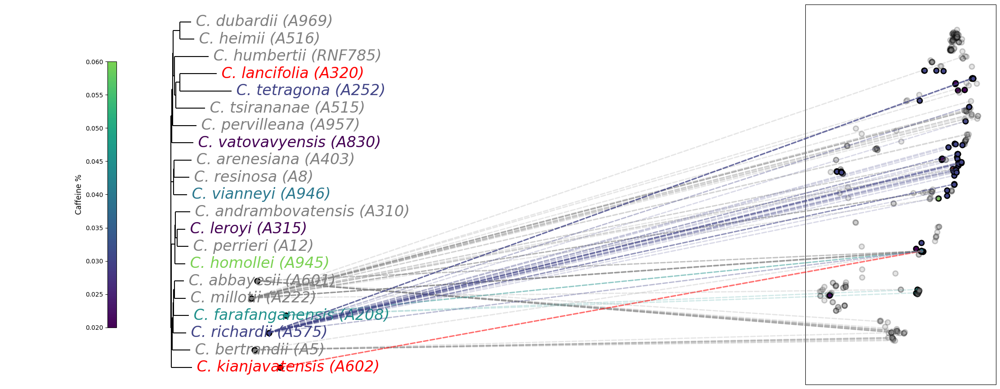

In [22]:
fig, axes = plt.subplots(
    1, 2, figsize=(30, 11), gridspec_kw={"wspace": 0.6}  # horizontal gap
)
ax_tree, ax_placeholder = axes

# replace placeholder with a real PlateCarree map
rect = ax_placeholder.get_position()
ax_placeholder.remove()
ax_map = fig.add_axes(rect, projection=ccrs.PlateCarree())

# — Phylogenetic tree panel —
Phylo.draw(
    tree,
    do_show=False,
    axes=ax_tree,
    label_func=custom_label,
    label_colors={
        label_map.get(raw, raw): col
        for raw, col in zip(gps["specimen_id"], gps["color"])
    },
)
for txt in ax_tree.texts:
    txt.set_fontsize(24)
    txt.set_fontstyle("italic")
ax_tree.axis("off")
ax_tree.set_xlim(-0.05, 1)
ax_tree.set_ylim(0, max(n.position[1] for n in tree.get_terminals()) + 2)

# plot the colored nodes
for clade in tree.get_terminals():
    plot_adjusted_node(ax_tree, clade, y_offset=1, offsets_dict=offsets, gps=gps)


# — geographic map panel —
ax_map.set_extent([43, 51, -27, -11])
for _, row in gps.iterrows():
    ax_map.plot(
        row["longitude"],
        row["latitude"],
        "o",
        markersize=8,
        markerfacecolor=row["color"],
        markeredgewidth=2,
        markeredgecolor="black",
        alpha=0.2 if row["caffeine_percent"] == 0 else 1.0,
    )
# legend
handles = [
    mlines.Line2D(
        [], [], color="grey", marker="o", linestyle="None", label="0% caffeine"
    ),
    mlines.Line2D(
        [],
        [],
        color="purple",
        marker="o",
        linestyle="None",
        label="0.02–0.06% caffeine",
    ),
    mlines.Line2D(
        [], [], color="red", marker="o", linestyle="None", label="0.7% caffeine"
    ),
]
#ax_map.legend(handles=handles, loc="lower right", fontsize=12)
with rasterio.open('../input/madaclim_enviro.tif') as src:
    band_data = src.read(1)
    show(band_data, ax=ax_map, cmap='viridis')

# — colorbar on the left of the tree plot —
base = plt.get_cmap("viridis")
cmap = mcolors.ListedColormap(base(np.linspace(0, 0.8, 256)))
norm = mcolors.Normalize(vmin=0.02, vmax=0.06)
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
cbar = fig.colorbar(
    sm, ax=ax_tree, orientation="vertical", location="left", shrink=0.7, aspect=30
)
cbar.set_label("Caffeine %", fontsize=12)
cbar.ax.tick_params(labelsize=10)


# — draw connecting lines —
# collect terminal coords
term_coords = {
    clade.name: plot_adjusted_node(
        ax_tree, clade, y_offset=1, offsets_dict=offsets, gps=gps
    )
    for clade in tree.get_terminals()
}
# group gps points by specimen
gps_groups = (
    gps.groupby("specimen_id")[["longitude", "latitude", "color"]]
    .apply(lambda d: list(zip(d.longitude, d.latitude, d.color)))
    .to_dict()
)

for spec, pts in gps_groups.items():
    for lon, lat, color in pts:
        con = ConnectionPatch(
            xyA=term_coords[spec],
            coordsA="data",
            xyB=(lon, lat),
            coordsB="data",
            axesA=ax_tree,
            axesB=ax_map,
            color=color,
            linestyle="--",
            linewidth=2,
            alpha=0.2,
        )
        fig.add_artist(con)

plt.show()